In [1]:
import sys
import os
import subprocess
import tarfile
import shutil
from functools import partial
from tqdm import tqdm
from tqdm.auto import tqdm
tqdm.pandas()

import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import (random_split, DataLoader, TensorDataset, ConcatDataset)
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits import mplot3d
from Bio import motifs

import boda
from boda.generator.parameters import StraightThroughParameters
from boda.generator import FastSeqProp
from boda.generator.plot_tools import matrix_to_dms, ppm_to_IC, ppm_to_pwm
from boda.model.mpra_basset import MPRA_Basset
from boda.common import constants, utils

boda_src = os.path.join( os.path.dirname( os.path.dirname( os.getcwd() ) ), 'src' )
sys.path.insert(0, boda_src)

from main import unpack_artifact, model_fn
from pymeme import streme, parse_streme_output

In [2]:
#for variable-length sequences
def get_onehots(in_df, seq_column='nt_sequence', extra_str=''):
    padding_fn = partial(utils.row_pad_sequence,
                            in_column_name=seq_column,
                            padded_seq_len=600)    
    print('Padding sequences' + extra_str)
    sequence_list = list(in_df.progress_apply(padding_fn, axis=1))     
    print('Tokenizing sequences' + extra_str)
    onehot_sequences = torch.stack([utils.dna2tensor(subsequence) for subsequence in tqdm(sequence_list)])
    return onehot_sequences

# def get_predictions(onehot_sequences, model, eval_batch_size = 128, num_workers=2, extra_str=''):
#     temp_dataset = TensorDataset(onehot_sequences)
#     temp_dataloader = DataLoader(temp_dataset, batch_size=eval_batch_size, shuffle=False, num_workers=num_workers)
#     print('Getting predictions' + extra_str)  
#     preds = []
#     for local_batch in tqdm(temp_dataloader):
#         preds.append(model(local_batch[0].cuda()).cpu().detach().numpy())       
#     preds_array = np.concatenate(preds, axis=0)  
#     return preds_array

def get_predictions(onehot_sequences, model, eval_batch_size = 128, num_workers=2, extra_str='', dual_pred=False):
    temp_dataset = TensorDataset(onehot_sequences)
    temp_dataloader = DataLoader(temp_dataset, batch_size=eval_batch_size, shuffle=False, num_workers=num_workers)
    print('Getting predictions' + extra_str)  
    preds = []
    for local_batch in tqdm(temp_dataloader):
        if dual_pred:
            in_tensor = utils.reverse_complement_onehot(local_batch[0])
        else:
            in_tensor = local_batch[0]
        preds.append(model(in_tensor.cuda()).cpu().detach().numpy())       
    preds_array = np.concatenate(preds, axis=0)  
    return preds_array

def entropy(X):
    p_c = F.softmax(torch.tensor(X, dtype=torch.float32), dim=1).numpy()
    return np.sum(- p_c * np.log(p_c), axis=1)

In [3]:
def append_predictions(dfs, model_paths, model_nicknames=None):
    activity_columns = ['K562_mean', 'HepG2_mean', 'SKNSH_mean']
    print('------------- Getting input tensors for each df -------------')
    print('')
    onehot_inputs = [get_onehots(df) for df in dfs]    
    if model_nicknames is None:
        model_nicknames = [str(i) for i in range(1, len(model_paths)+1)]
    assert len(model_nicknames) == len(model_paths)
    if os.path.isdir('./artifacts'):
        shutil.rmtree('./artifacts')
    prediction_columns_dict = {}
    for model_idx, model_path in enumerate(model_paths):
        unpack_artifact(model_path)
        model_dir = './artifacts'
        model = model_fn(model_dir)
        model.cuda()
        model.eval()
        model_nickname = model_nicknames[model_idx]
        prediction_columns = [activity_name.rstrip('mean') + 'pred_' \
                              + model_nickname for activity_name in activity_columns]
        prediction_columns_dict[model_nickname] = prediction_columns
        print('')
        print(f'------------- Getting model_{model_nickname} predictions for each df -------------')
        print('')
        for df_idx, df in enumerate(dfs):
            df[prediction_columns] = get_predictions(onehot_inputs[df_idx], model)
    return prediction_columns_dict

In [5]:
#UKBB + GTEX + BODA
# main_df = pd.read_csv('gs://syrgoth/data/MPRA_ALL_no_cutoffs.txt', sep=" ", low_memory=False)

# test_df = main_df[(main_df['chr'] == '7') | (main_df['chr'] == '13')].reset_index(drop=True)
# test_df = test_df[test_df['K562_mean'].notnull() & test_df['HepG2_mean'].notnull() & test_df['SKNSH_mean'].notnull()].reset_index(drop=True)

# synth_df = main_df[(main_df['chr'] == 'synth')].reset_index(drop=True)
# synth_df = synth_df[synth_df['K562_mean'].notnull() & synth_df['HepG2_mean'].notnull() & synth_df['SKNSH_mean'].notnull()].reset_index(drop=True)

# gtex_test_df = test_df[test_df['data_project'] == 'GTEX']

# #CMS
# cms_df = pd.read_csv('gs://syrgoth/data/MPRA_CMS.txt', sep=" ", low_memory=False)
# cms_df = cms_df[cms_df['nt_sequence'] != ' '].reset_index(drop=True)
# cms_df = cms_df[test_df['K562_mean'].notnull() & cms_df['HepG2_mean'].notnull() & cms_df['SKNSH_mean'].notnull()].reset_index(drop=True)

# #Locus Select
# locus_df = pd.read_csv('gs://syrgoth/data/MPRA_LocusSelect.txt', sep=" ", low_memory=False)
# locus_df = locus_df[(locus_df['project'] == 'Tiles-GATA') | (locus_df['project'] == 'Tiles-MYC')]
# locus_df = locus_df.rename({'log2FoldChange': 'K562_mean'}, axis=1)
# locus_df = locus_df[locus_df['K562_mean'].notnull()].reset_index(drop=True)

#GTEX new pipeline
# gtex_noShrink_df = pd.read_csv('gs://syrgoth/data/MPRA_GTEX_cellDisp_noShrink.txt', sep=" ", low_memory=False)
# gtex_noShrink_test_df = gtex_noShrink_df[(gtex_noShrink_df['chr'] == '7') | (gtex_noShrink_df['chr'] == '13')].reset_index(drop=True)

# gtex_Shrink_df = pd.read_csv('gs://syrgoth/data/MPRA_GTEX_cellDisp_Shrink.txt', sep=" ", low_memory=False)
# gtex_Shrink_test_df = gtex_Shrink_df[(gtex_Shrink_df['chr'] == '7') | (gtex_Shrink_df['chr'] == '13')].reset_index(drop=True)

#FADS
fads_df = pd.read_csv('gs://syrgoth/data/MPRA_FADS.txt', sep=" ", low_memory=False)
fads_df = fads_df[fads_df['project'] == 'Tiles']
fads_df = fads_df.rename({'log2FoldChange': 'K562_mean'}, axis=1)
fads_df = fads_df[fads_df['K562_mean'].notnull()].reset_index(drop=True)

In [7]:
# model_nicknames = ['relu', 'relu6', 'relu_HD']
# model_paths = ['gs://syrgoth/aip_ui_test/model_artifacts__20211113_021200__287348.tar.gz',
#                'gs://syrgoth/aip_ui_test/model_artifacts__20211110_194934__672830.tar.gz',
#                'gs://syrgoth/aip_ui_test/model_artifacts__20211119_011437__338420.tar.gz']
# performance_dfs = [test_df, synth_df, cms_df, locus_df]

# prediction_columns_dict = append_predictions(performance_dfs, model_paths, model_nicknames=model_nicknames)

model_nicknames = ['relu', 'relu6']
model_paths = ['gs://syrgoth/aip_ui_test/model_artifacts__20211113_021200__287348.tar.gz',
               'gs://syrgoth/aip_ui_test/model_artifacts__20211110_194934__672830.tar.gz']

performance_dfs = [fads_df]

prediction_columns_dict = append_predictions(performance_dfs, model_paths, model_nicknames=model_nicknames)

------------- Getting input tensors for each df -------------

Padding sequences


  0%|          | 0/43910 [00:00<?, ?it/s]

Tokenizing sequences


  0%|          | 0/43910 [00:00<?, ?it/s]

archive unpacked in ./


Loaded model from 20211113_021200 in eval mode

------------- Getting model_relu predictions for each df -------------

Getting predictions


  0%|          | 0/344 [00:00<?, ?it/s]

/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:652: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool1d(input, kernel_size, stride, padding, dilation, ceil_mode)


Loaded model from 20211110_194934 in eval mode

------------- Getting model_relu6 predictions for each df -------------

Getting predictions


archive unpacked in ./


  0%|          | 0/344 [00:00<?, ?it/s]

In [23]:
# for df in [test_df, synth_df]:
#     df['entropy'] = entropy(df[['K562_mean', 'HepG2_mean', 'SKNSH_mean']].to_numpy())
#     df['max_lfcSE'] = df[['lfcSE_k562', 'lfcSE_hepg2', 'lfcSE_sknsh']].max(axis=1)

# for model in prediction_columns_dict:
#     pred_columns = prediction_columns_dict[model]
#     for df in [test_df, synth_df]:
#         df['entropy_' + model] = entropy(df[pred_columns].to_numpy())
        
for df in performance_dfs:
    df['entropy'] = entropy(df[['K562_mean', 'HepG2_mean', 'SKNSH_mean']].to_numpy())
    df['max_lfcSE'] = df[['lfcSE_k562', 'lfcSE_hepg2', 'lfcSE_sknsh']].max(axis=1)

for model in prediction_columns_dict:
    pred_columns = prediction_columns_dict[model]
    for df in performance_dfs:
        df['entropy_' + model] = entropy(df[pred_columns].to_numpy())

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

In [8]:
def single_scatterplot(data_df, x_axis, y_axis, color_axis, fig_size=(15,8), dot_size=0.5, title='',
                       dot_alpha=0.5, style='seaborn-whitegrid', colormap='winter',
                       x_label='True', y_label='Predicted', color_label='l2fc SE', title_font_size=18,
                       title_font_weight='medium', axis_font_size=16):
    with plt.style.context(style):
        fig, ax = plt.subplots()    
        data_df.plot(kind='scatter', x=x_axis, y=y_axis, figsize=fig_size, c=color_axis, ax=ax,
                        alpha=dot_alpha, s=dot_size, colormap=colormap)
        plt.xlabel(x_label, fontsize=axis_font_size)
        plt.ylabel(y_label, fontsize=axis_font_size)

        f = plt.gcf()
        cax = f.get_axes()[1]
        cax.set_ylabel(color_label, fontsize=axis_font_size)

        x_min, y_min = data_df[[x_axis, y_axis]].min().to_numpy() 
        x_max, y_max = data_df[[x_axis, y_axis]].max().to_numpy()
        min_point, max_point = max(x_min, y_min), min(x_max, y_max)
        plt.plot((min_point,max_point), (min_point,max_point), color='black', linestyle='--', alpha=0.5)

        Pearson = round(data_df[[x_axis, y_axis]].corr(method='pearson')[x_axis][1], 2)
        Spearman = round(data_df[[x_axis, y_axis]].corr(method='spearman')[x_axis][1], 2)

        title = f'{title}  |  Pearson={Pearson}  Spearman={Spearman}'
        ax.set_title(title, fontdict={'fontsize': title_font_size, 'fontweight': title_font_weight}, pad=15)

In [23]:
fads_df['K562_pred_avg'] = fads_df[['K562_pred_relu', 'K562_pred_relu6']].mean(axis=1)

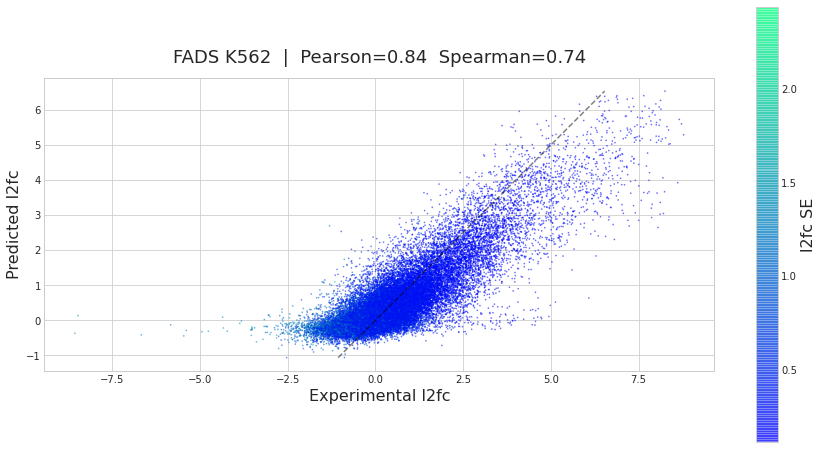

In [29]:
plot_df = fads_df[fads_df['Ctrl.Mean'] >= 100]
single_scatterplot(data_df=plot_df,
               x_axis='K562_mean',
               y_axis='K562_pred_avg',
               color_axis='lfcSE',
               fig_size=(15,8),
               dot_size=0.5,
               title='FADS K562',
               dot_alpha=0.5,
               colormap=colormaps[cell_idx],
               x_label='Experimental l2fc',
               y_label='Predicted l2fc',
               color_label='l2fc SE')
plt.gca().set_aspect('equal', adjustable='box')
plt.show()

--------------------------------------------------relu--------------------------------------------------


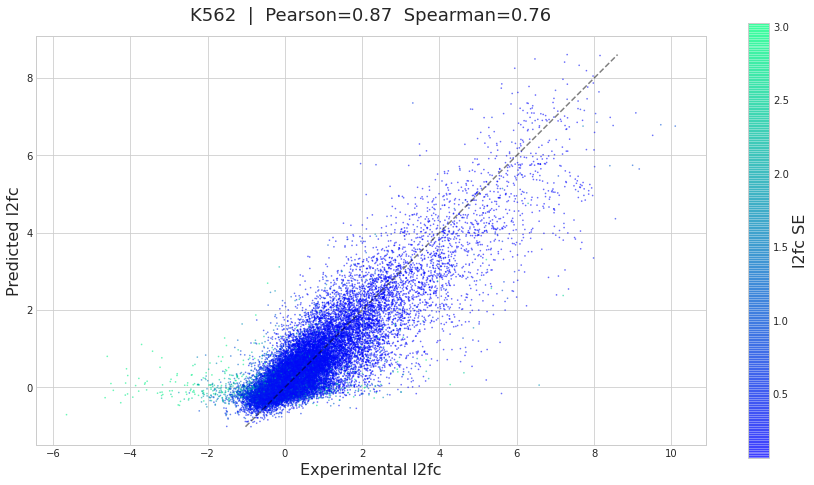

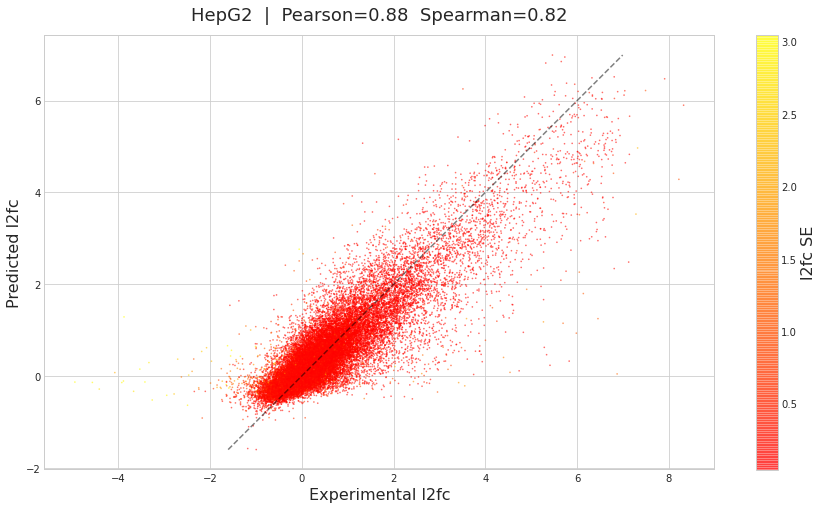

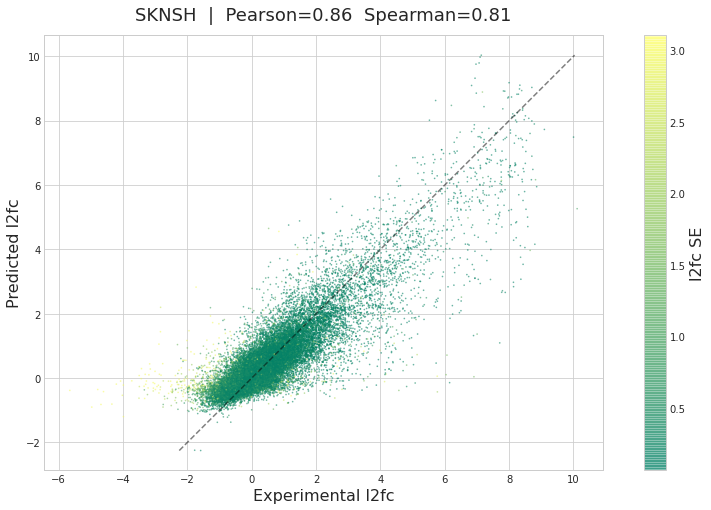

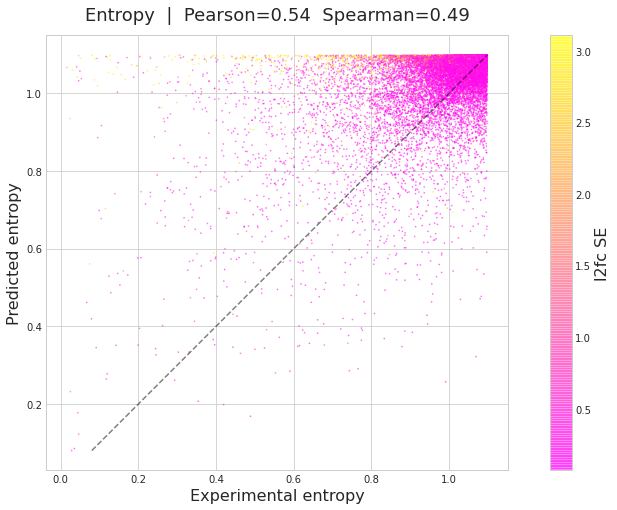

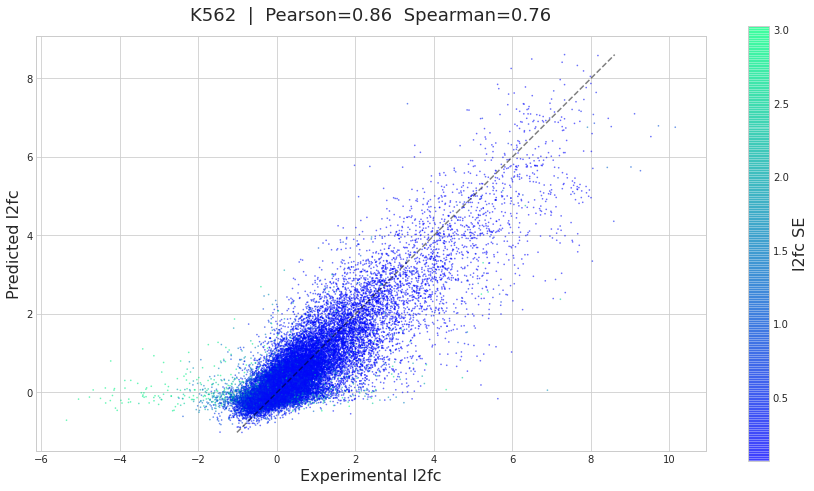

...

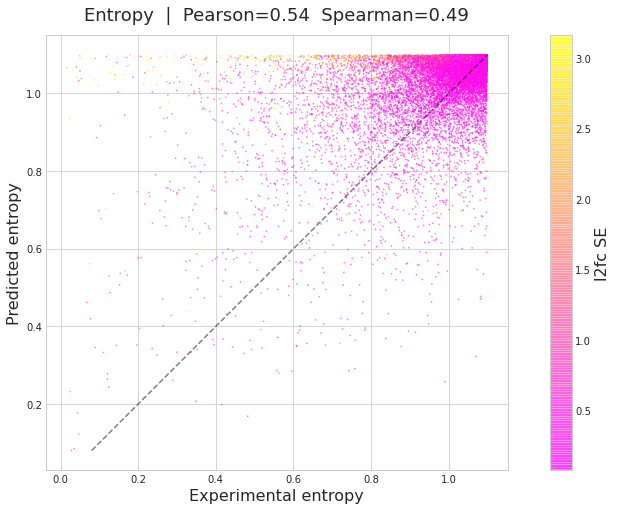

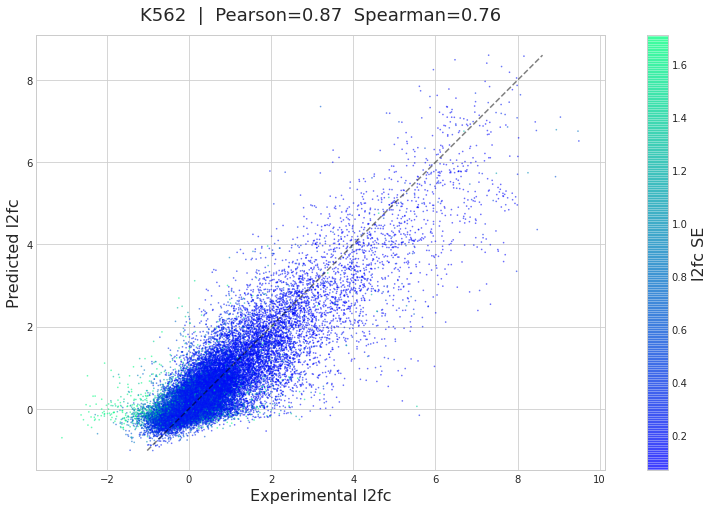

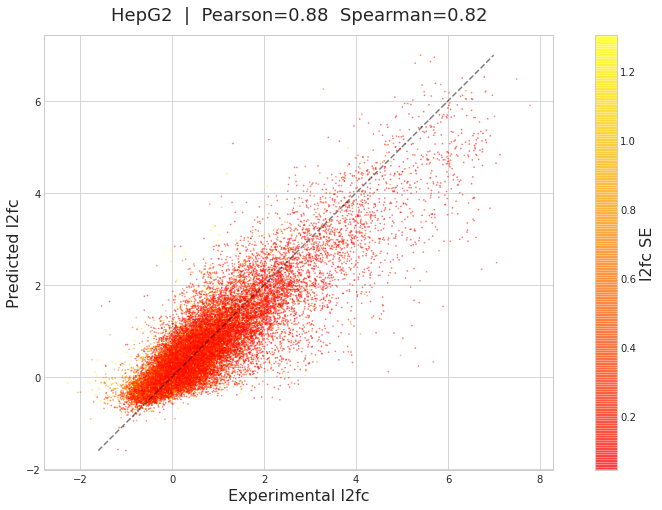

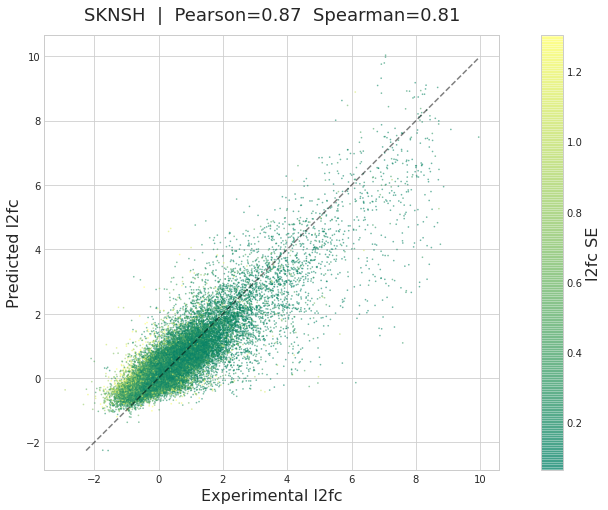

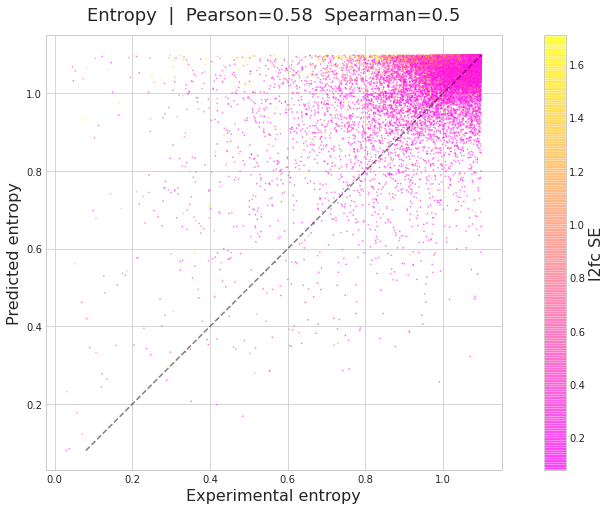

--------------------------------------------------relu6--------------------------------------------------


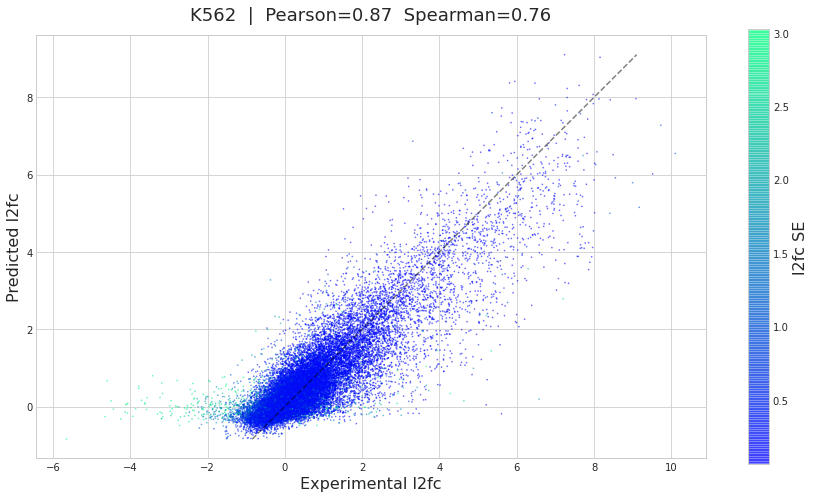

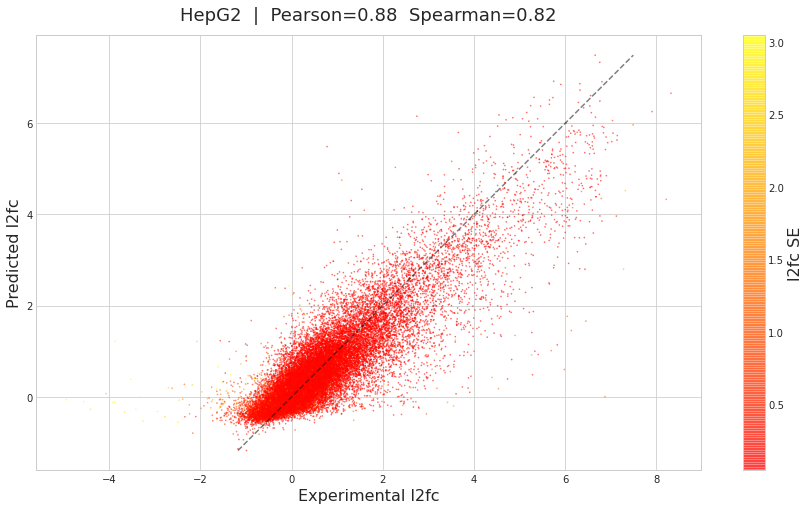

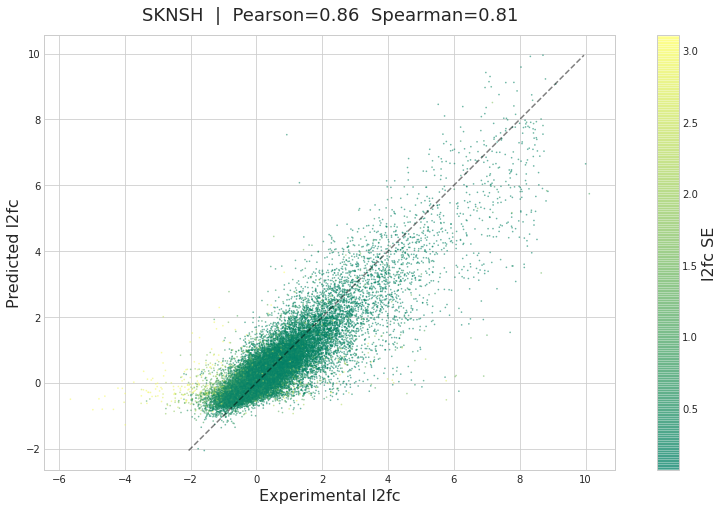

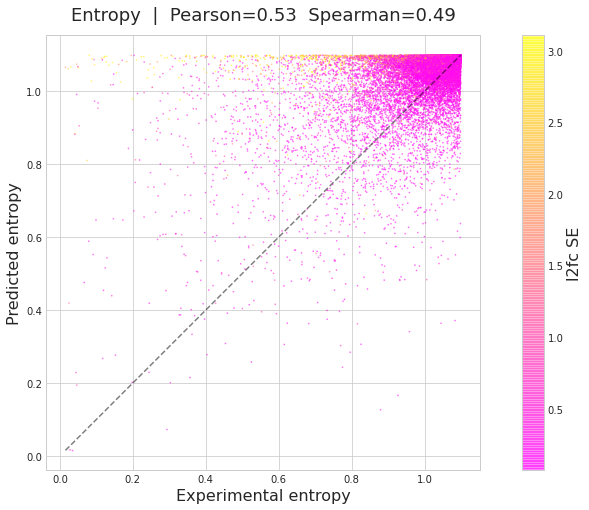

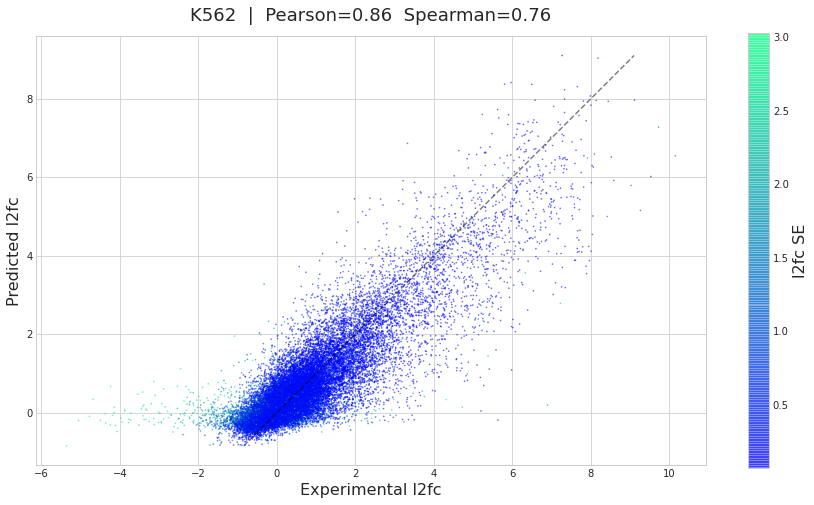

...

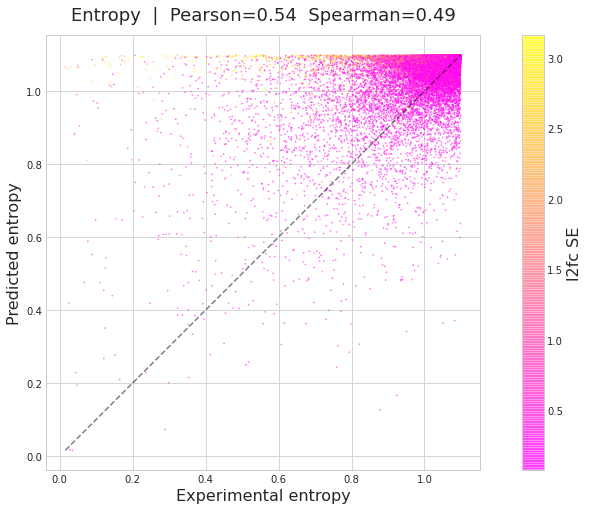

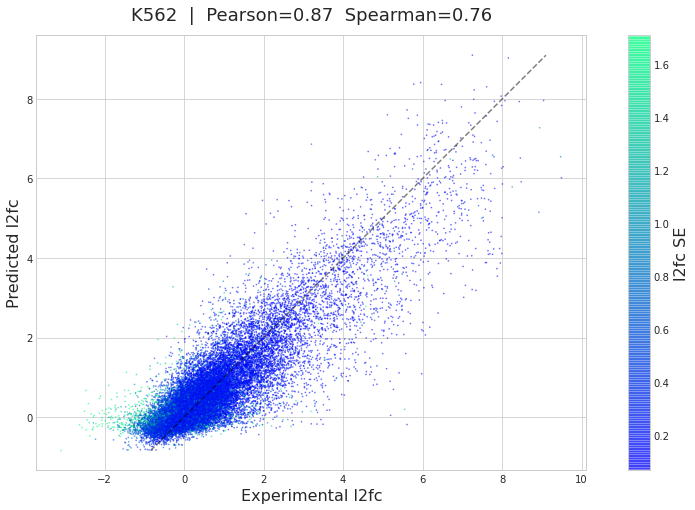

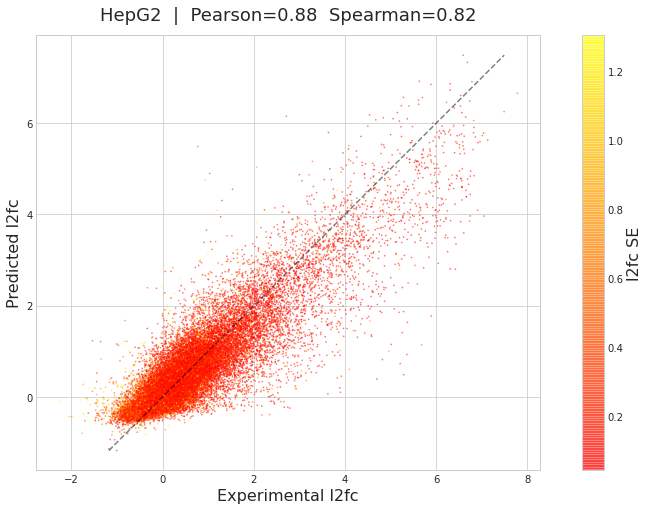

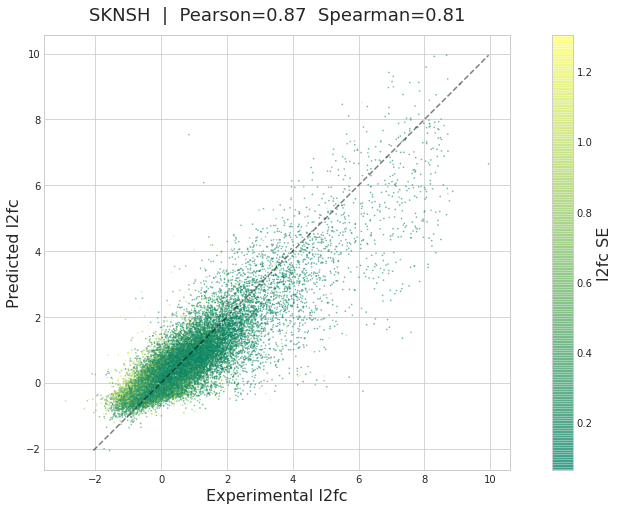

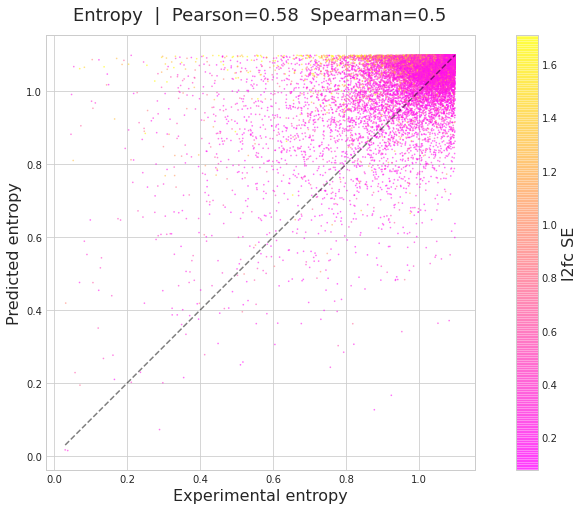

In [24]:
#GTEX pipeline comparison
for model in model_nicknames:
    print(50*'-' + model + 50*'-')
    for plot_df in performance_dfs:
        activity_columns = ['K562_mean', 'HepG2_mean', 'SKNSH_mean']
        coloring_columns = ['lfcSE_k562', 'lfcSE_hepg2', 'lfcSE_sknsh']
        colormaps = ['winter', 'autumn', 'summer']
        for cell_idx, activity in enumerate(activity_columns):
            cell_name = activity.rstrip('_mean')
            pred_column_name =  cell_name + '_pred_' + model
            single_scatterplot(data_df=plot_df,
                       x_axis=activity,
                       y_axis=pred_column_name,
                       color_axis=coloring_columns[cell_idx],
                       fig_size=(15,8),
                       dot_size=0.5,
                       title=cell_name,
                       dot_alpha=0.5,
                       colormap=colormaps[cell_idx],
                       x_label='Experimental l2fc',
                       y_label='Predicted l2fc',
                       color_label='l2fc SE')
            plt.gca().set_aspect('equal', adjustable='box')
            plt.show()
        single_scatterplot(data_df=plot_df,
                   x_axis='entropy',
                   y_axis='entropy_'+ model,
                   color_axis='max_lfcSE',
                   fig_size=(15,8),
                   dot_size=0.5,
                   title='Entropy',
                   dot_alpha=0.5,
                   colormap='spring',
                   x_label='Experimental entropy',
                   y_label='Predicted entropy',
                   color_label='l2fc SE')
        plt.gca().set_aspect('equal', adjustable='box')
        plt.show()

--------------------------------------------------relu--------------------------------------------------
-------------- Test sets --------------


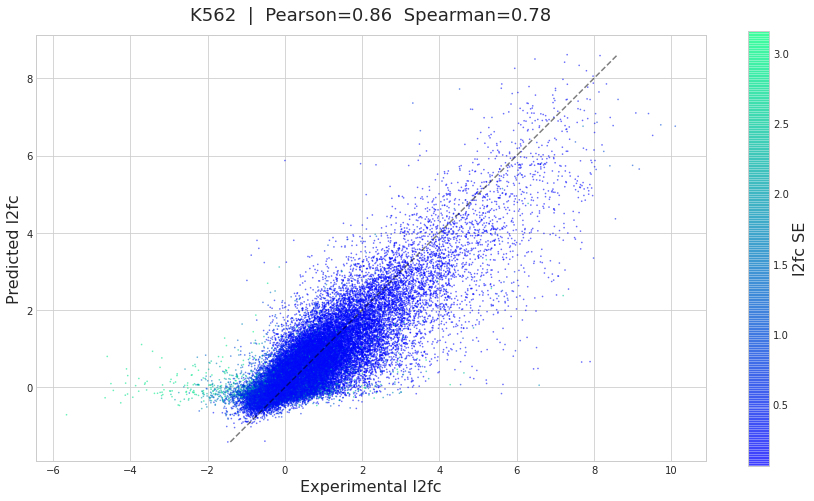

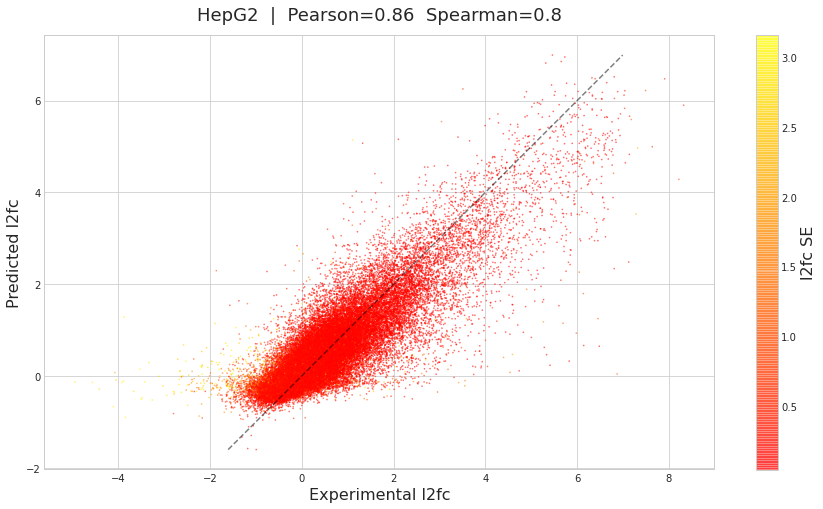

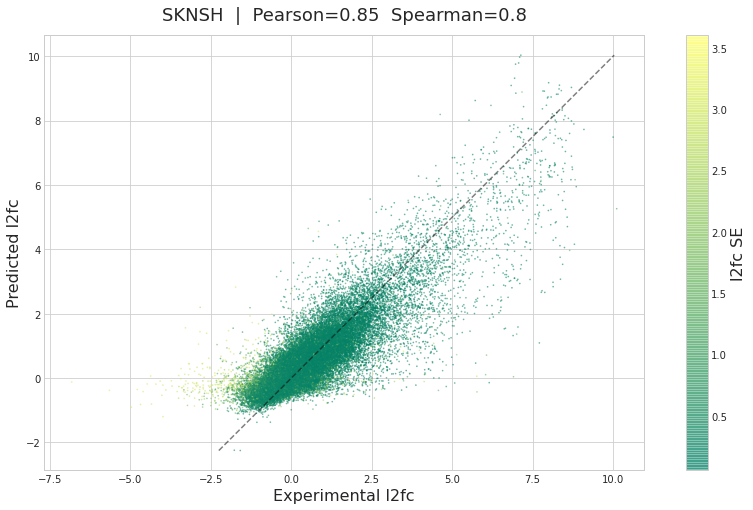

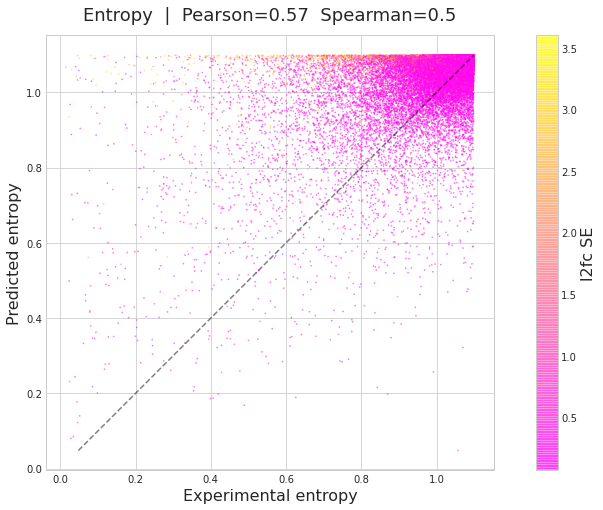

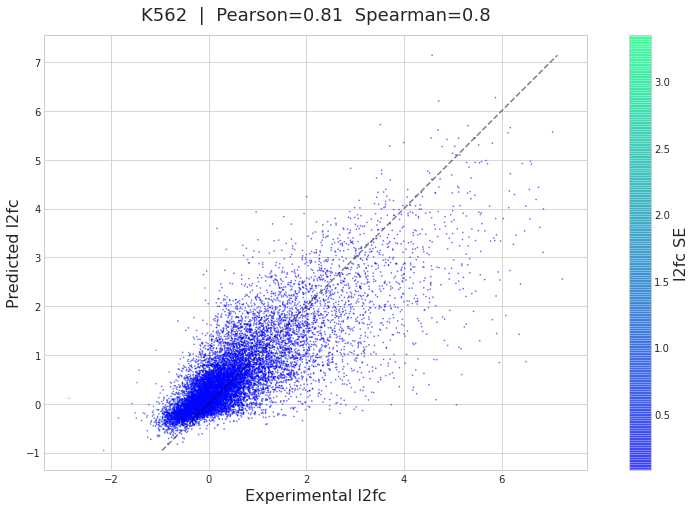

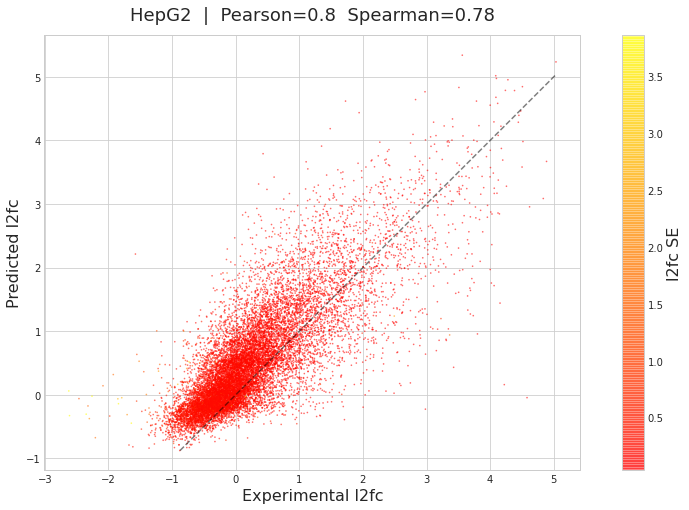

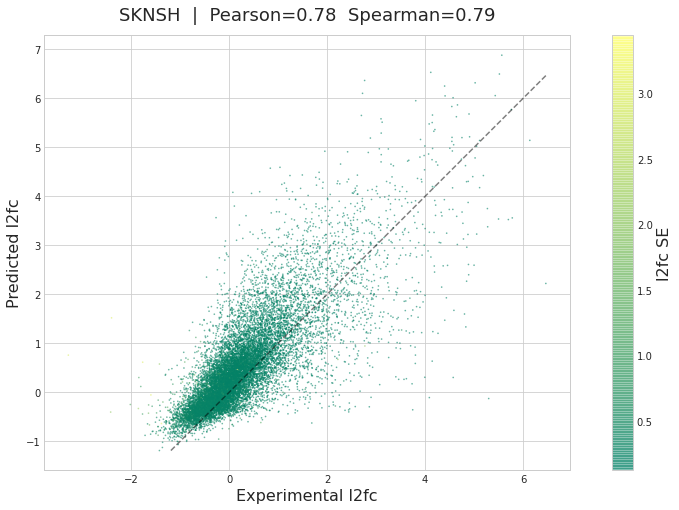

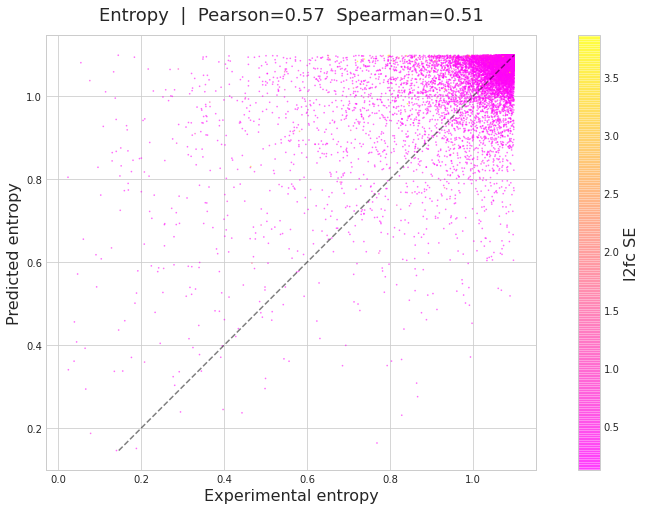

-------------- CMS --------------


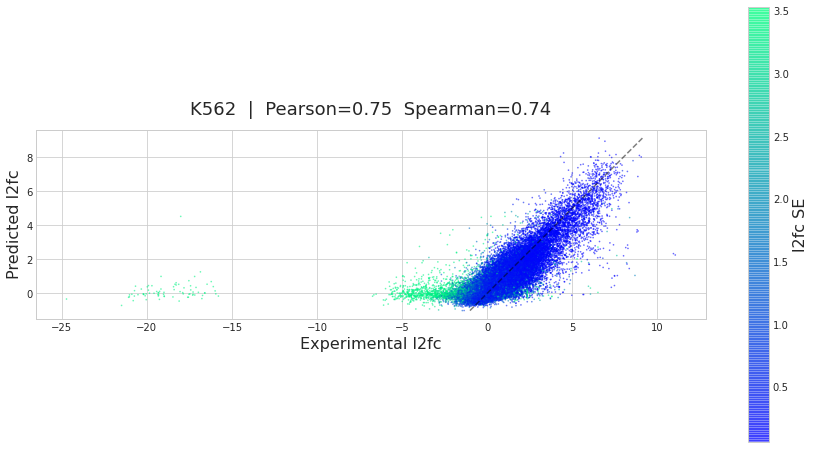

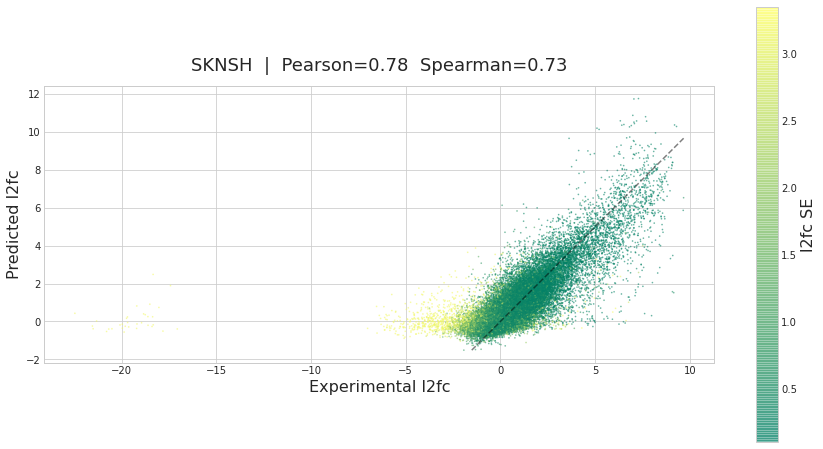

-------------- Locus Select --------------


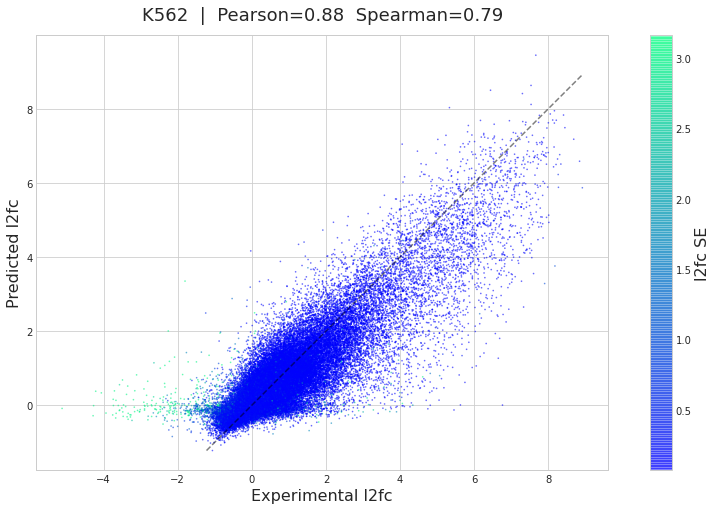

--------------------------------------------------relu6--------------------------------------------------
-------------- Test sets --------------


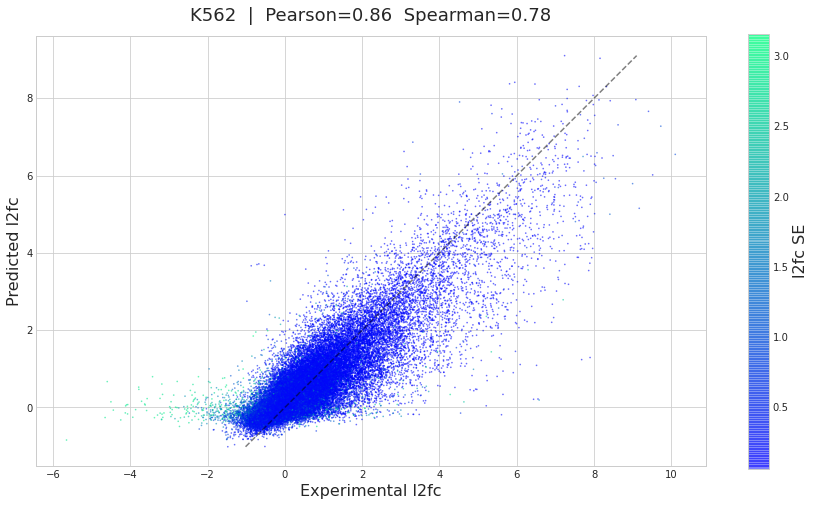

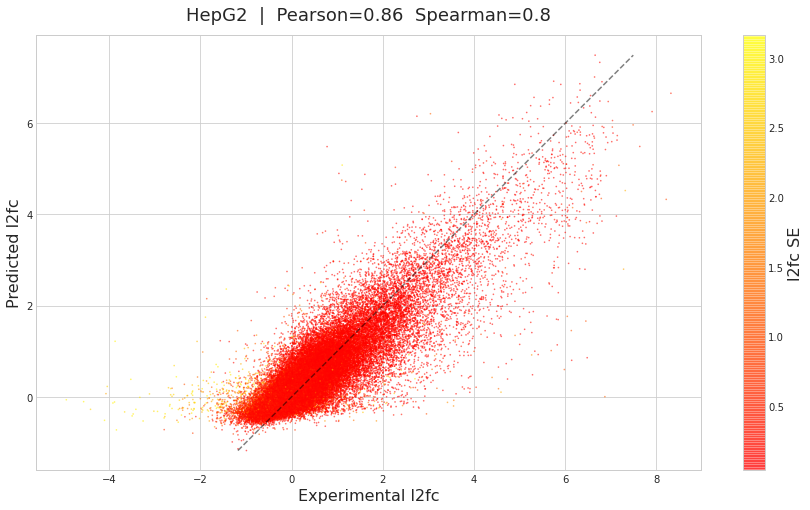

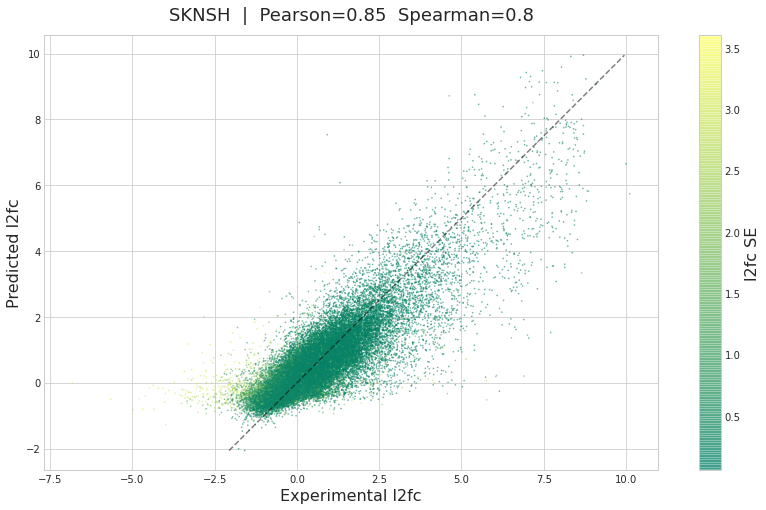

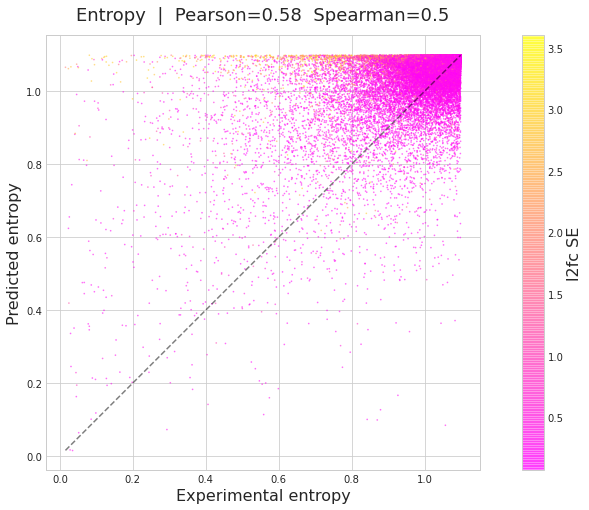

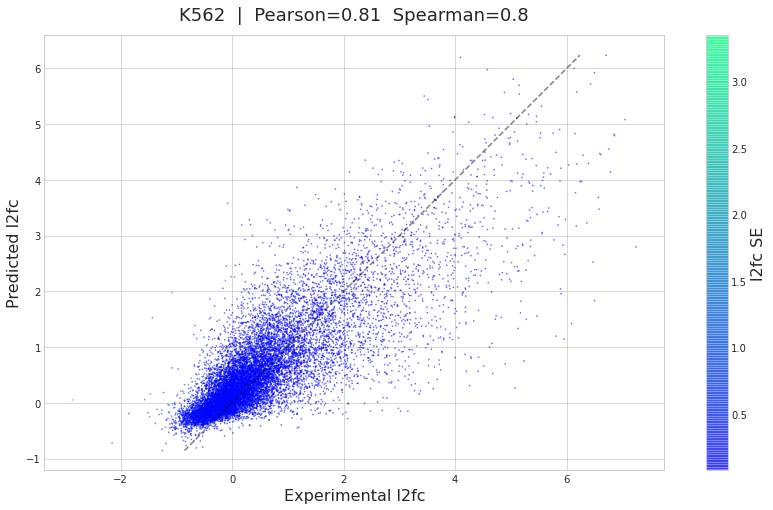

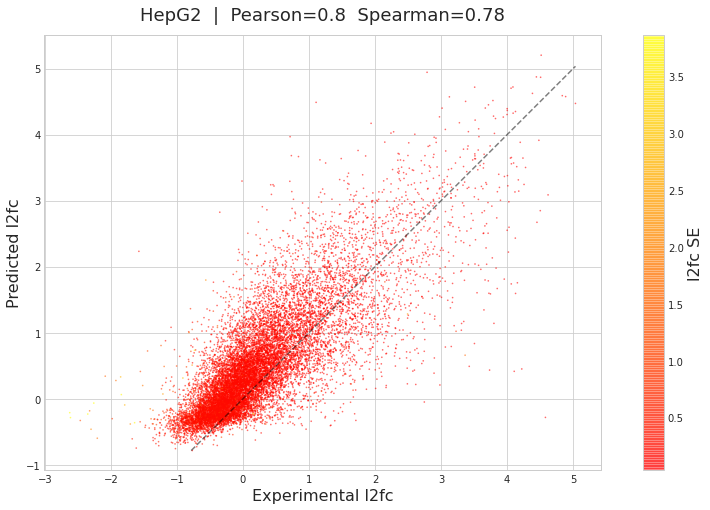

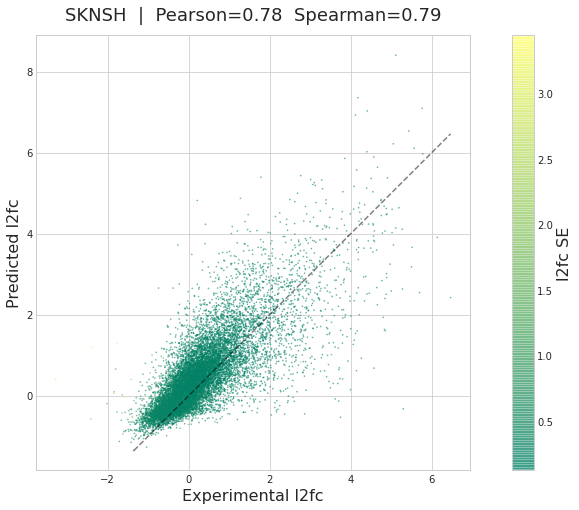

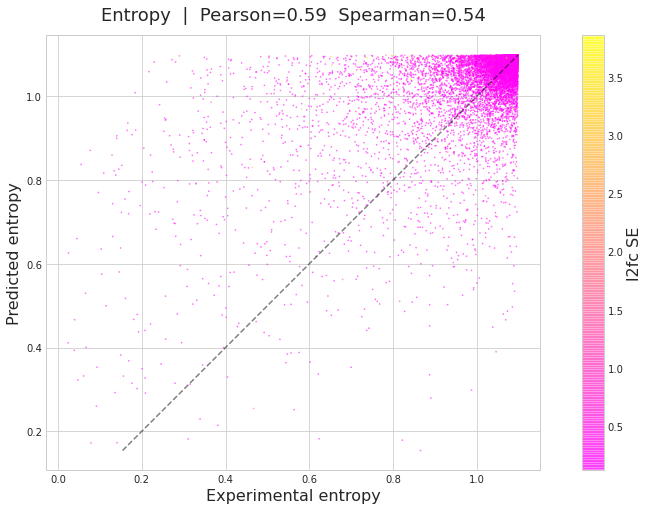

-------------- CMS --------------


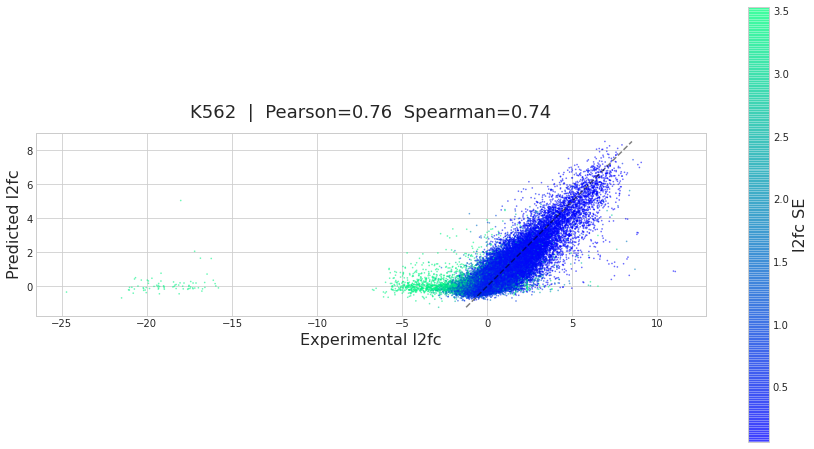

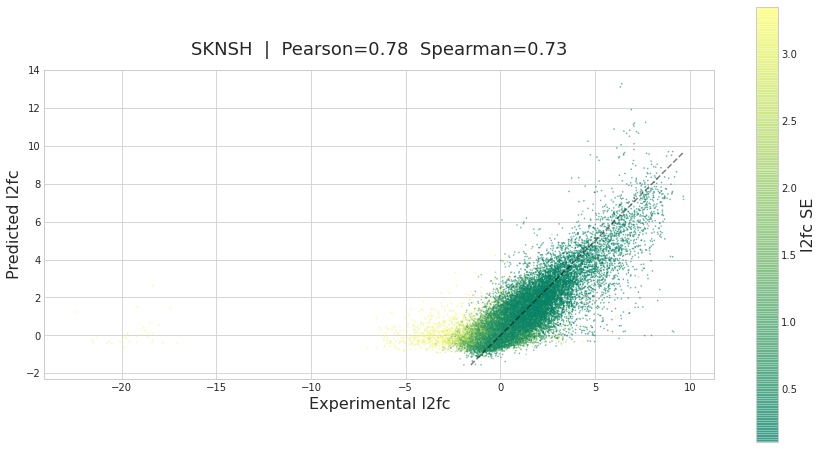

-------------- Locus Select --------------


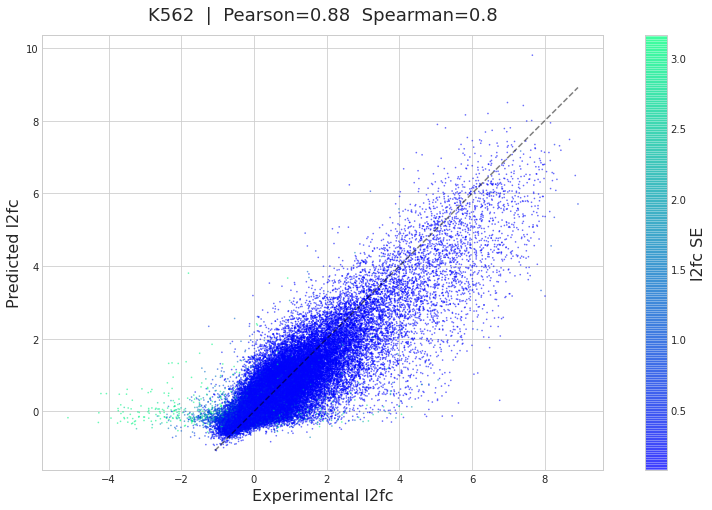

--------------------------------------------------relu_HD--------------------------------------------------
-------------- Test sets --------------


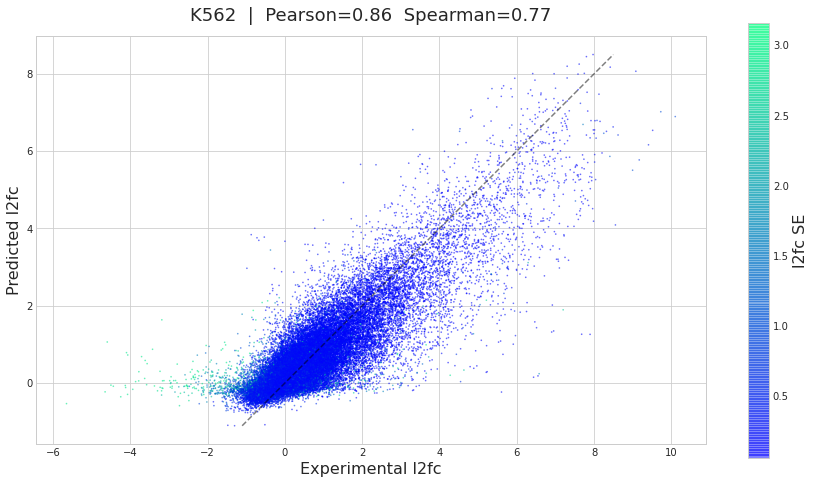

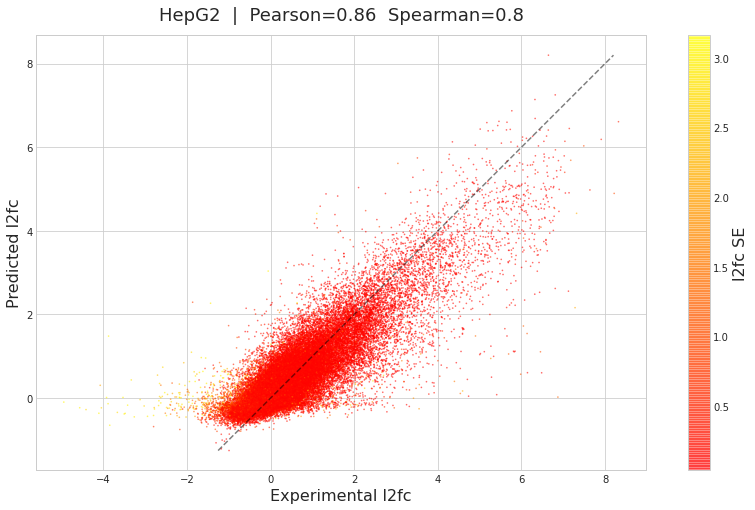

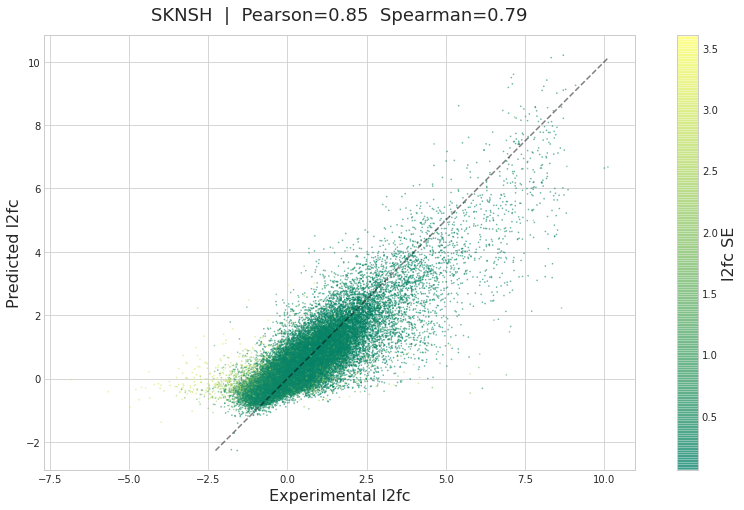

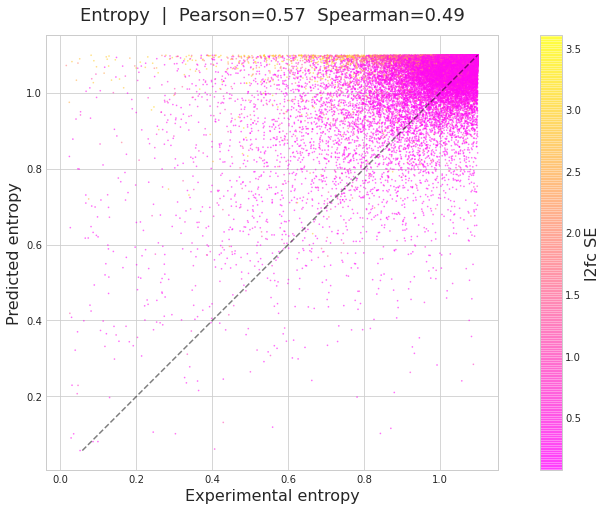

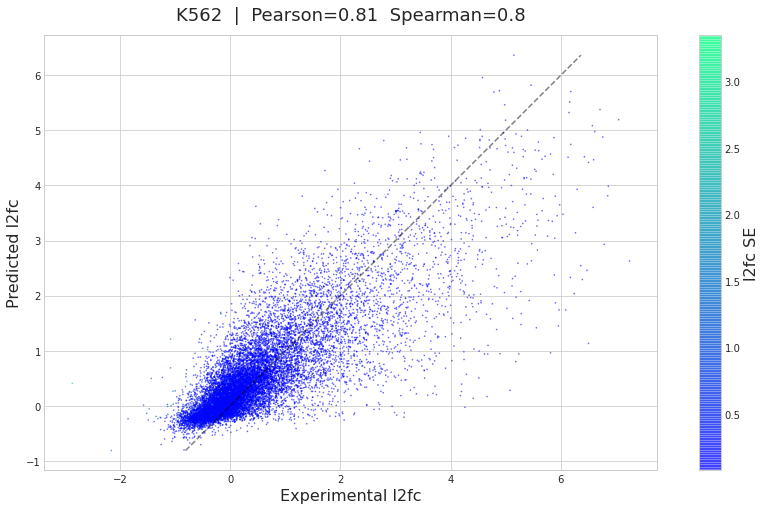

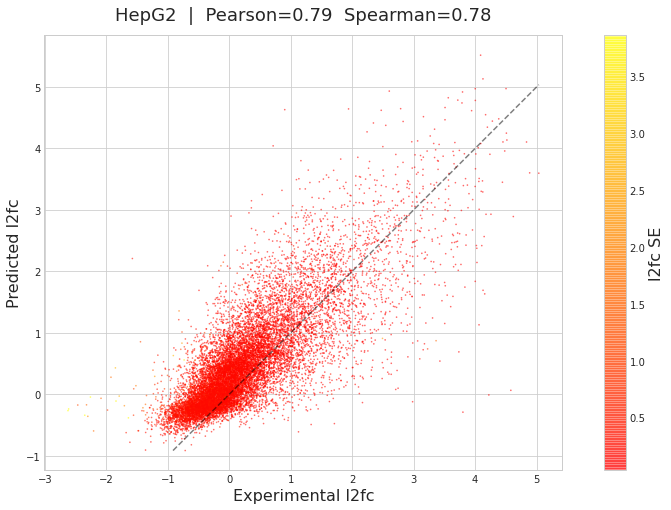

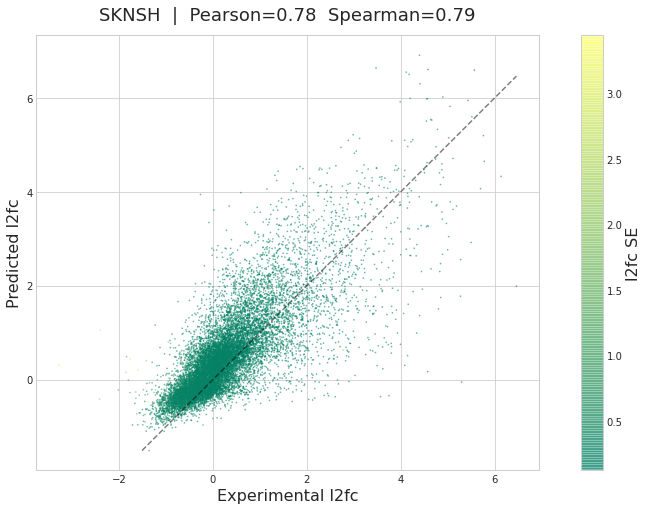

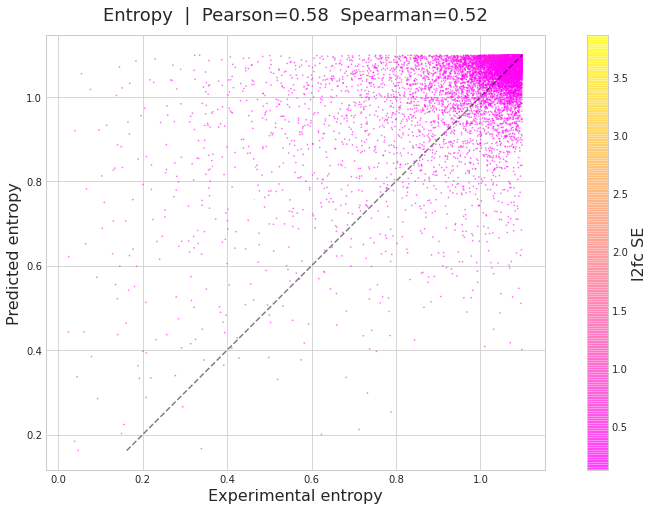

-------------- CMS --------------


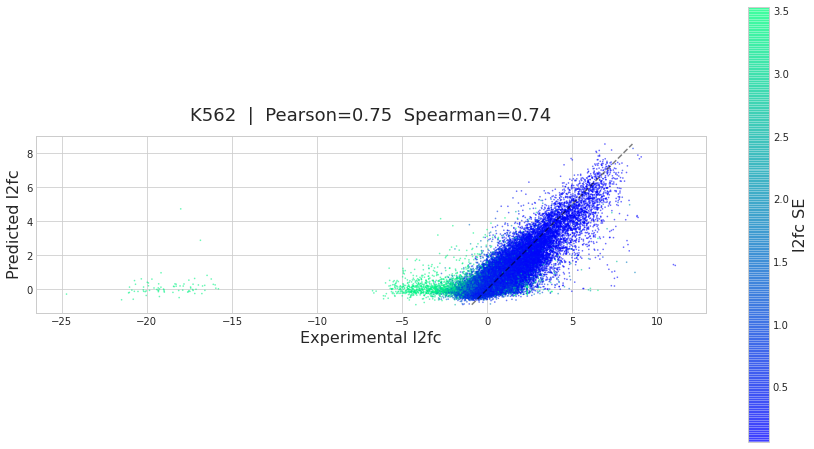

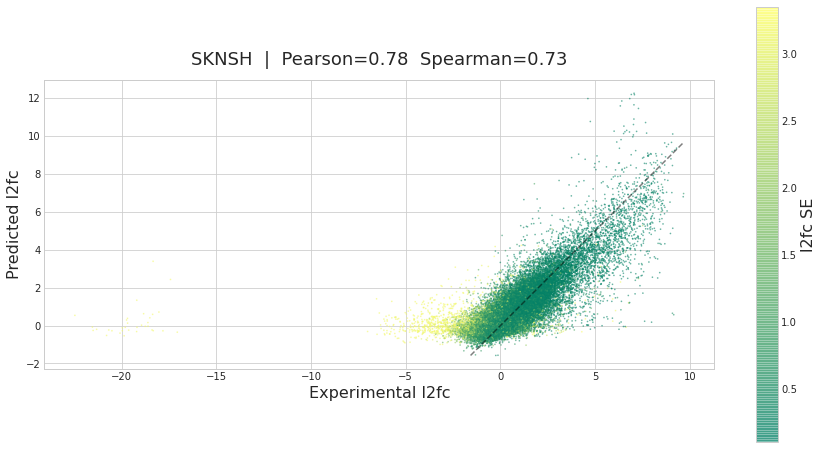

-------------- Locus Select --------------


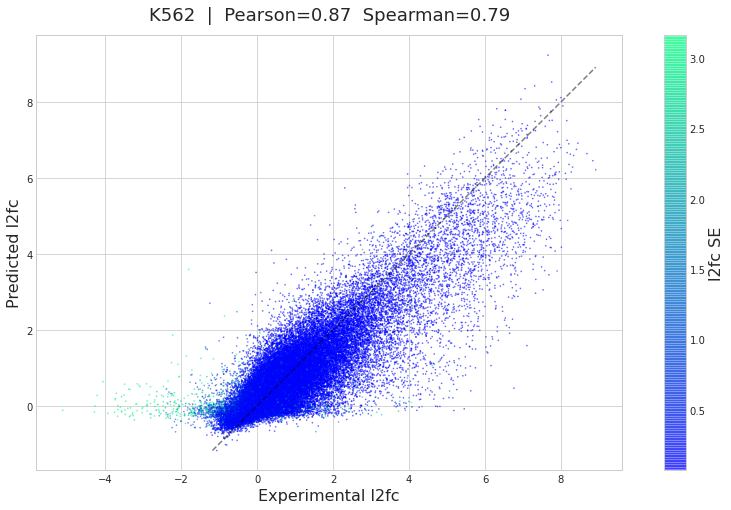

In [78]:
for model in model_nicknames:
    print(50*'-' + model + 50*'-')
    print('-------------- Test sets --------------')
    for plot_df in [test_df, synth_df]:
        activity_columns = ['K562_mean', 'HepG2_mean', 'SKNSH_mean']
        coloring_columns = ['lfcSE_k562', 'lfcSE_hepg2', 'lfcSE_sknsh']
        colormaps = ['winter', 'autumn', 'summer']
        for cell_idx, activity in enumerate(activity_columns):
            cell_name = activity.rstrip('_mean')
            pred_column_name =  cell_name + '_pred_' + model
            single_scatterplot(data_df=plot_df,
                       x_axis=activity,
                       y_axis=pred_column_name,
                       color_axis=coloring_columns[cell_idx],
                       fig_size=(15,8),
                       dot_size=0.5,
                       title=cell_name,
                       dot_alpha=0.5,
                       colormap=colormaps[cell_idx],
                       x_label='Experimental l2fc',
                       y_label='Predicted l2fc',
                       color_label='l2fc SE')
            plt.gca().set_aspect('equal', adjustable='box')
            plt.show()
        single_scatterplot(data_df=plot_df,
                   x_axis='entropy',
                   y_axis='entropy_'+ model,
                   color_axis='max_lfcSE',
                   fig_size=(15,8),
                   dot_size=0.5,
                   title='Entropy',
                   dot_alpha=0.5,
                   colormap='spring',
                   x_label='Experimental entropy',
                   y_label='Predicted entropy',
                   color_label='l2fc SE')
        plt.gca().set_aspect('equal', adjustable='box')
        plt.show()
    print('-------------- CMS --------------')
    plot_df = cms_df
    activity_columns = ['K562_mean', 'SKNSH_mean']
    coloring_columns = ['lfcSE_k562',  'lfcSE_sknsh']
    colormaps = ['winter', 'summer']
    for cell_idx, activity in enumerate(activity_columns):
        cell_name = activity.rstrip('_mean')
        pred_column_name =  cell_name + '_pred_' + model
        single_scatterplot(data_df=plot_df,
                   x_axis=activity,
                   y_axis=pred_column_name,
                   color_axis=coloring_columns[cell_idx],
                   fig_size=(15,8),
                   dot_size=0.5,
                   title=cell_name,
                   dot_alpha=0.5,
                   colormap=colormaps[cell_idx],
                   x_label='Experimental l2fc',
                   y_label='Predicted l2fc',
                   color_label='l2fc SE')
        plt.gca().set_aspect('equal', adjustable='box')
        plt.show()
    print('-------------- Locus Select --------------')
    plot_df = locus_df
    activity_columns = ['K562_mean']
    coloring_columns = ['lfcSE']
    colormaps = ['winter']
    for cell_idx, activity in enumerate(activity_columns):
        cell_name = activity.rstrip('_mean')
        pred_column_name =  cell_name + '_pred_' + model
        single_scatterplot(data_df=plot_df,
                   x_axis=activity,
                   y_axis=pred_column_name,
                   color_axis=coloring_columns[cell_idx],
                   fig_size=(15,8),
                   dot_size=0.5,
                   title=cell_name,
                   dot_alpha=0.5,
                   colormap=colormaps[cell_idx],
                   x_label='Experimental l2fc',
                   y_label='Predicted l2fc',
                   color_label='l2fc SE')
        plt.gca().set_aspect('equal', adjustable='box')
        plt.show()

In [96]:
avg_prediction_columns = ['K562_pred_avg', 'HepG2_pred_avg', 'SKNSH_pred_avg']
for i in range(len(avg_prediction_columns)):
    for df in performance_dfs:
        df[avg_prediction_columns[i]] = df[[columns[i] for columns in prediction_columns_dict.values()]].mean(axis=1)
        
prediction_columns_dict['avg'] = avg_prediction_columns
model_nicknames.append('avg')

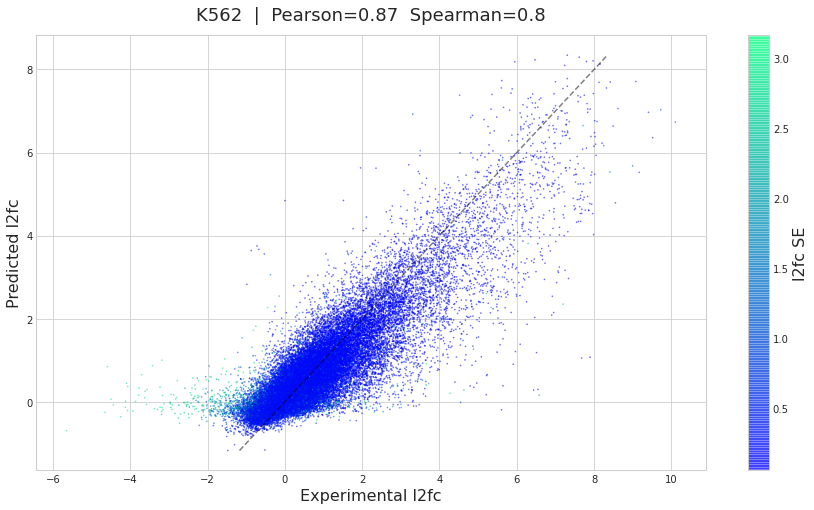

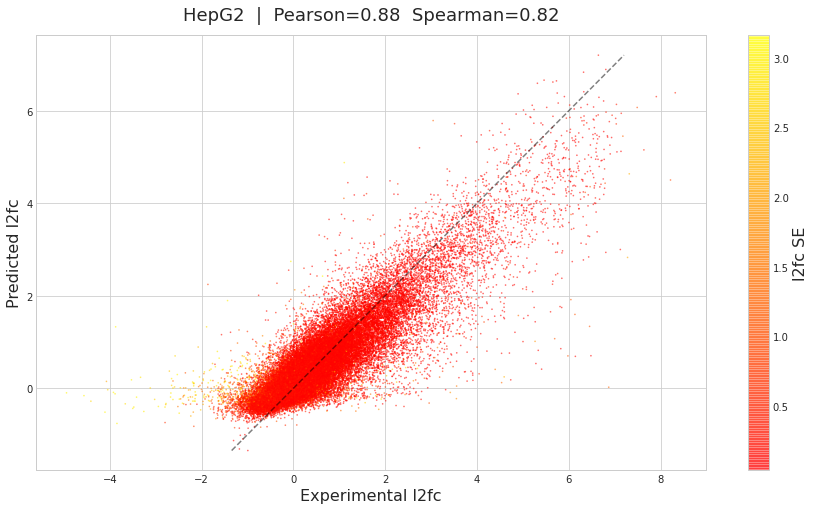

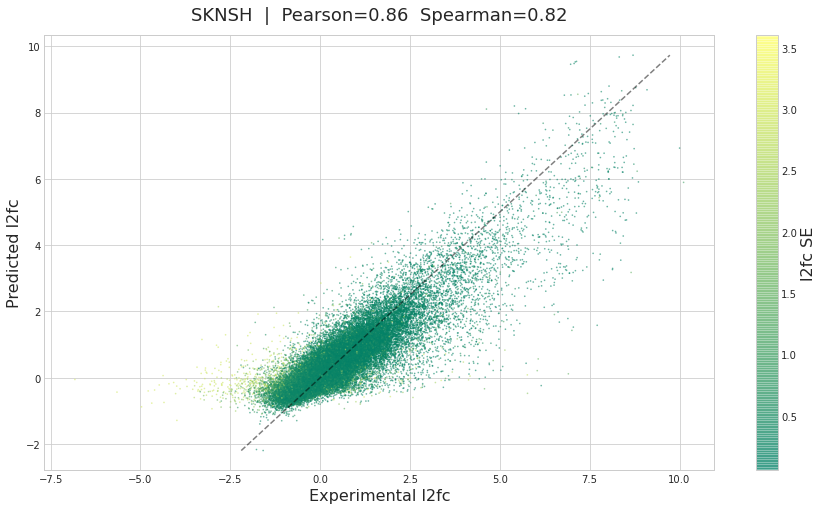

In [93]:
single_scatterplot(data_df=test_df,
                   x_axis='K562_mean',
                   y_axis='K562_pred_avg',
                   color_axis='lfcSE_k562',
                   fig_size=(15,8),
                   dot_size=0.5,
                   title='K562',
                   dot_alpha=0.5,
                   colormap='winter',
                   x_label='Experimental l2fc',
                   y_label='Predicted l2fc',
                   color_label='l2fc SE')
plt.show()

single_scatterplot(data_df=test_df,
                   x_axis='HepG2_mean',
                   y_axis='HepG2_pred_avg',
                   color_axis='lfcSE_hepg2',
                   fig_size=(15,8),
                   dot_size=0.5,
                   title='HepG2',
                   dot_alpha=0.5,
                   colormap='autumn',
                   x_label='Experimental l2fc',
                   y_label='Predicted l2fc',
                   color_label='l2fc SE')
plt.show()

single_scatterplot(data_df=test_df,
                   x_axis='SKNSH_mean',
                   y_axis='SKNSH_pred_avg',
                   color_axis='lfcSE_sknsh',
                   fig_size=(15,8),
                   dot_size=0.5,
                   title='SKNSH',
                   dot_alpha=0.5,
                   colormap='summer',
                   x_label='Experimental l2fc',
                   y_label='Predicted l2fc',
                   color_label='l2fc SE')
plt.show()

In [97]:
test_df['entropy_pred_avg'] = entropy(test_df[['K562_pred_avg', 'HepG2_pred_avg', 'SKNSH_pred_avg']].to_numpy())
synth_df['entropy_pred_avg'] = entropy(synth_df[['K562_pred_avg', 'HepG2_pred_avg', 'SKNSH_pred_avg']].to_numpy())

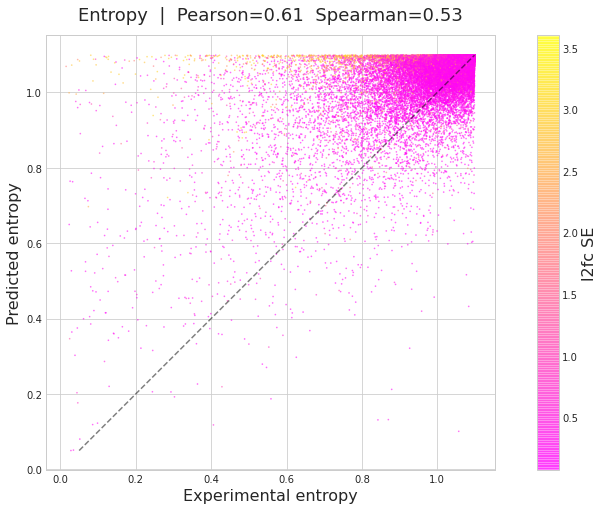

In [95]:
single_scatterplot(data_df=test_df,
                   x_axis='entropy',
                   y_axis='entropy_pred_avg',
                   color_axis='max_lfcSE',
                   fig_size=(15,8),
                   dot_size=0.5,
                   title='Entropy',
                   dot_alpha=0.5,
                   colormap='spring',
                   x_label='Experimental entropy',
                   y_label='Predicted entropy',
                   color_label='l2fc SE')
plt.gca().set_aspect('equal', adjustable='box')
plt.show()

-------------- Test sets --------------


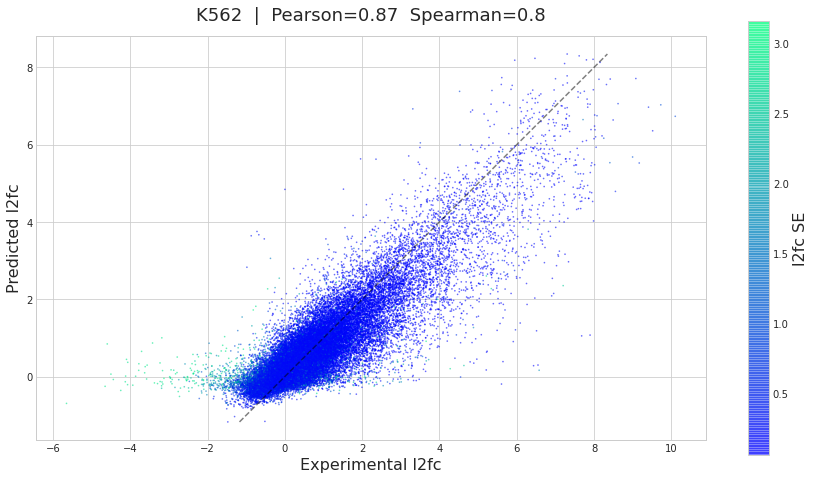

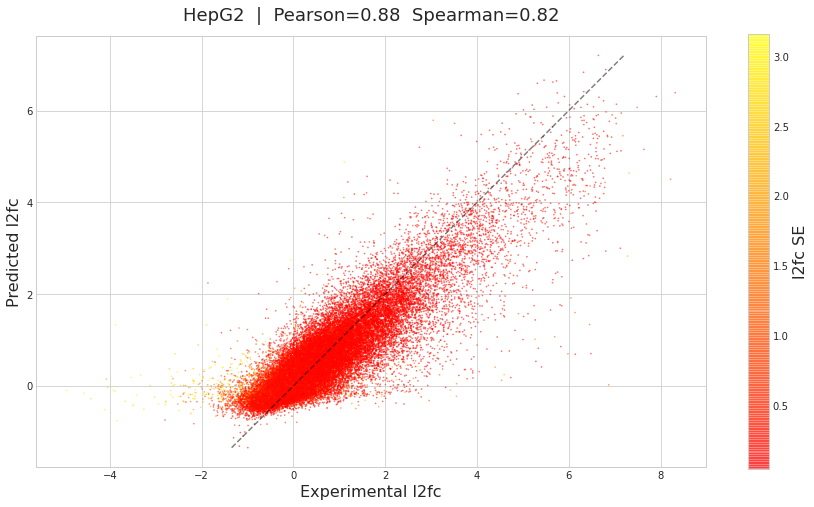

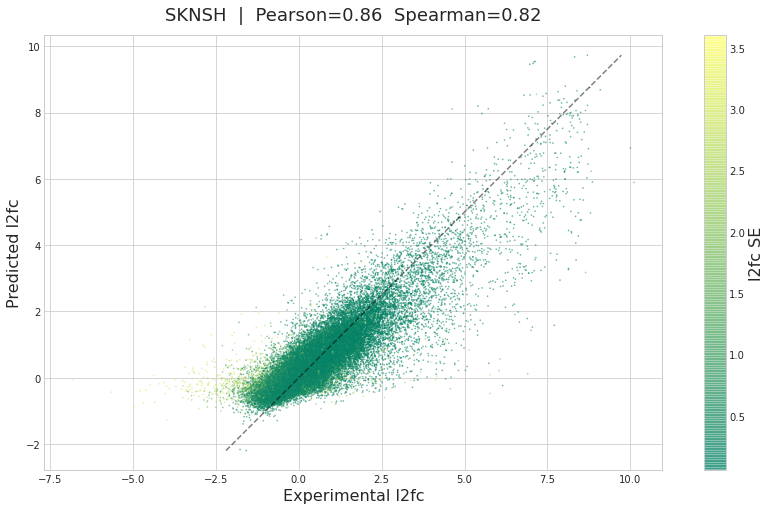

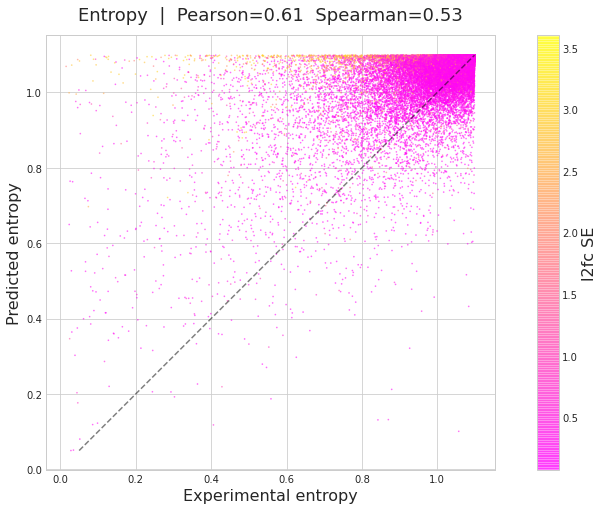

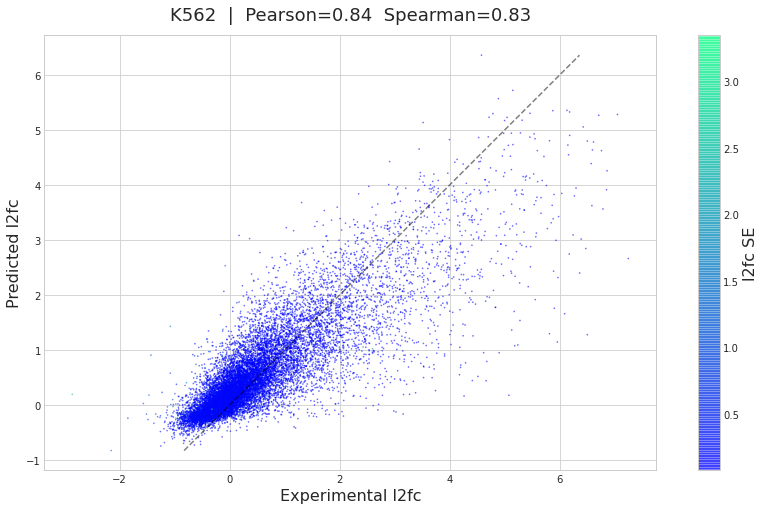

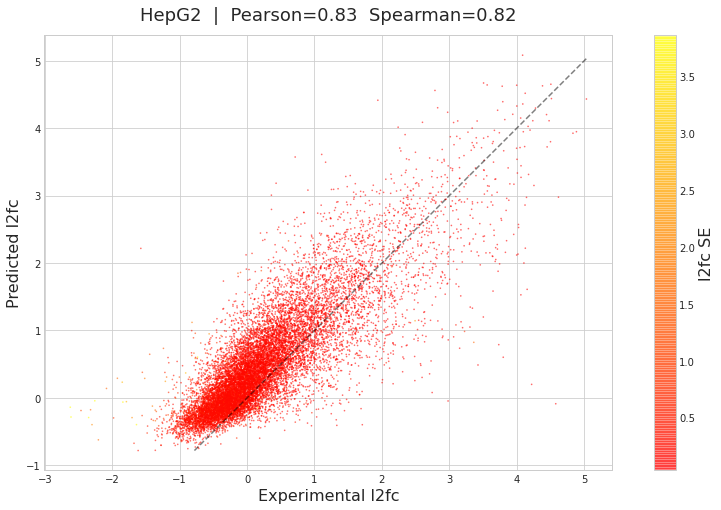

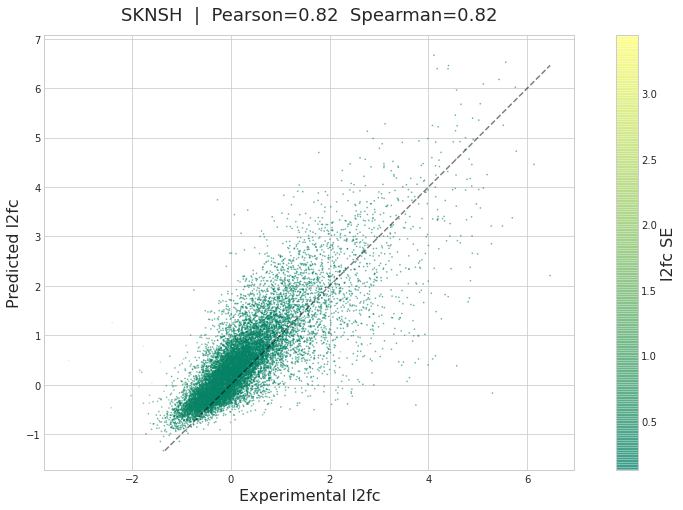

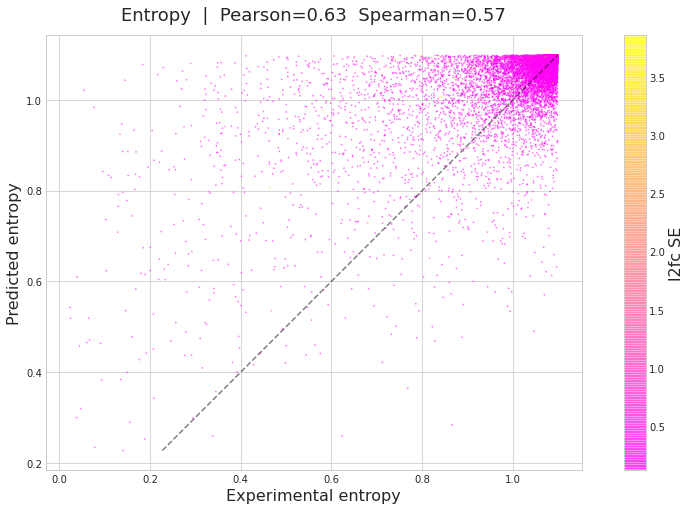

-------------- CMS --------------


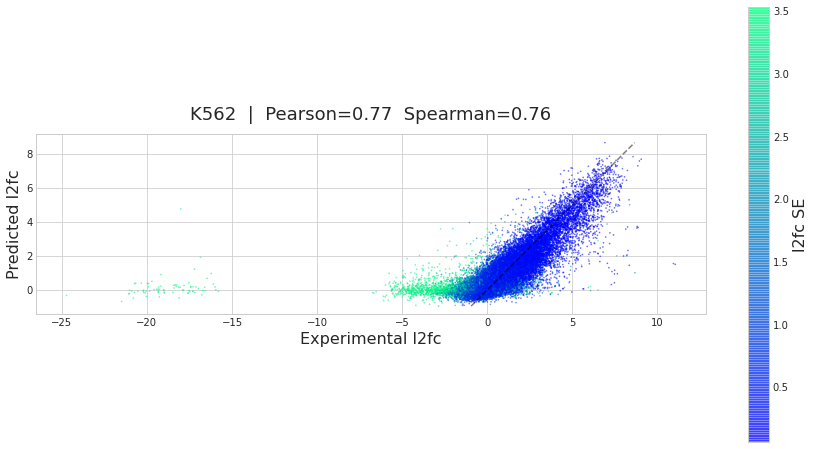

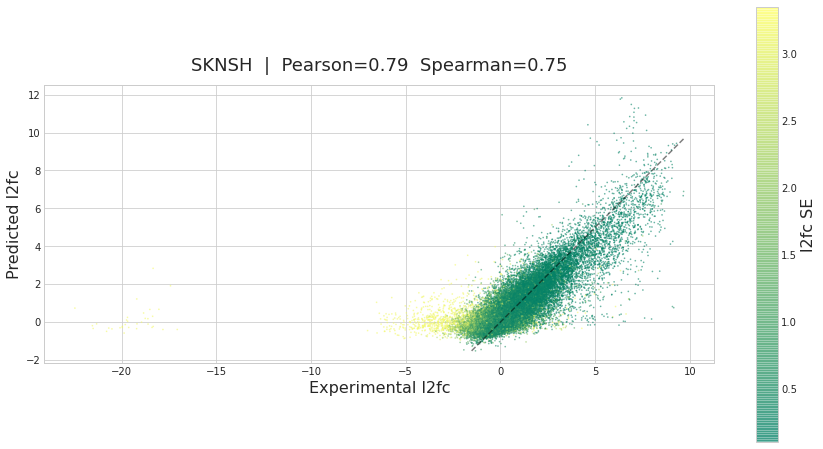

-------------- Locus Select --------------


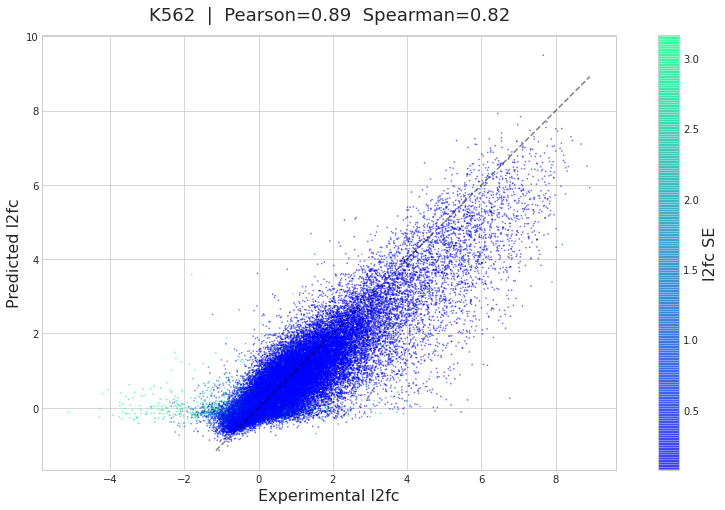

In [100]:
print('-------------- Test sets --------------')
for plot_df in [test_df, synth_df]:
    activity_columns = ['K562_mean', 'HepG2_mean', 'SKNSH_mean']
    coloring_columns = ['lfcSE_k562', 'lfcSE_hepg2', 'lfcSE_sknsh']
    colormaps = ['winter', 'autumn', 'summer']
    for cell_idx, activity in enumerate(activity_columns):
        cell_name = activity.rstrip('_mean')
        pred_column_name =  cell_name + '_pred_avg'
        single_scatterplot(data_df=plot_df,
                   x_axis=activity,
                   y_axis=pred_column_name,
                   color_axis=coloring_columns[cell_idx],
                   fig_size=(15,8),
                   dot_size=0.5,
                   title=cell_name,
                   dot_alpha=0.5,
                   colormap=colormaps[cell_idx],
                   x_label='Experimental l2fc',
                   y_label='Predicted l2fc',
                   color_label='l2fc SE')
        plt.gca().set_aspect('equal', adjustable='box')
        plt.show()
    single_scatterplot(data_df=plot_df,
               x_axis='entropy',
               y_axis='entropy_pred_avg',
               color_axis='max_lfcSE',
               fig_size=(15,8),
               dot_size=0.5,
               title='Entropy',
               dot_alpha=0.5,
               colormap='spring',
               x_label='Experimental entropy',
               y_label='Predicted entropy',
               color_label='l2fc SE')
    plt.gca().set_aspect('equal', adjustable='box')
    plt.show()
print('-------------- CMS --------------')
plot_df = cms_df
activity_columns = ['K562_mean', 'SKNSH_mean']
coloring_columns = ['lfcSE_k562',  'lfcSE_sknsh']
colormaps = ['winter', 'summer']
for cell_idx, activity in enumerate(activity_columns):
    cell_name = activity.rstrip('_mean')
    pred_column_name =  cell_name + '_pred_avg'
    single_scatterplot(data_df=plot_df,
               x_axis=activity,
               y_axis=pred_column_name,
               color_axis=coloring_columns[cell_idx],
               fig_size=(15,8),
               dot_size=0.5,
               title=cell_name,
               dot_alpha=0.5,
               colormap=colormaps[cell_idx],
               x_label='Experimental l2fc',
               y_label='Predicted l2fc',
               color_label='l2fc SE')
    plt.gca().set_aspect('equal', adjustable='box')
    plt.show()
print('-------------- Locus Select --------------')
plot_df = locus_df
activity_columns = ['K562_mean']
coloring_columns = ['lfcSE']
colormaps = ['winter']
for cell_idx, activity in enumerate(activity_columns):
    cell_name = activity.rstrip('_mean')
    pred_column_name =  cell_name + '_pred_avg'
    single_scatterplot(data_df=plot_df,
               x_axis=activity,
               y_axis=pred_column_name,
               color_axis=coloring_columns[cell_idx],
               fig_size=(15,8),
               dot_size=0.5,
               title=cell_name,
               dot_alpha=0.5,
               colormap=colormaps[cell_idx],
               x_label='Experimental l2fc',
               y_label='Predicted l2fc',
               color_label='l2fc SE')
    plt.gca().set_aspect('equal', adjustable='box')
    plt.show()

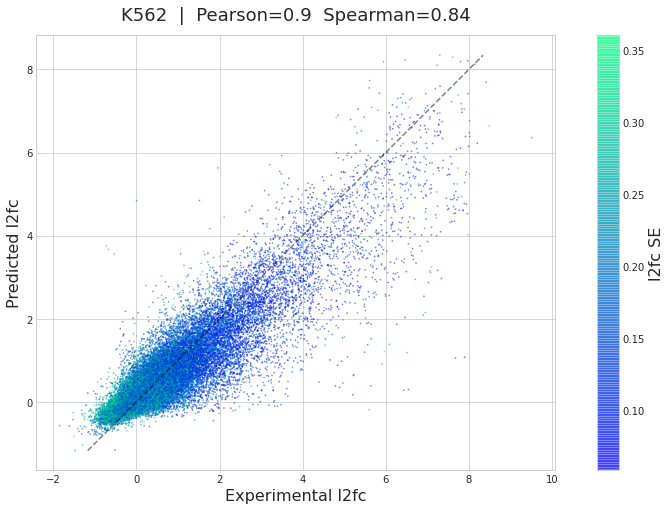

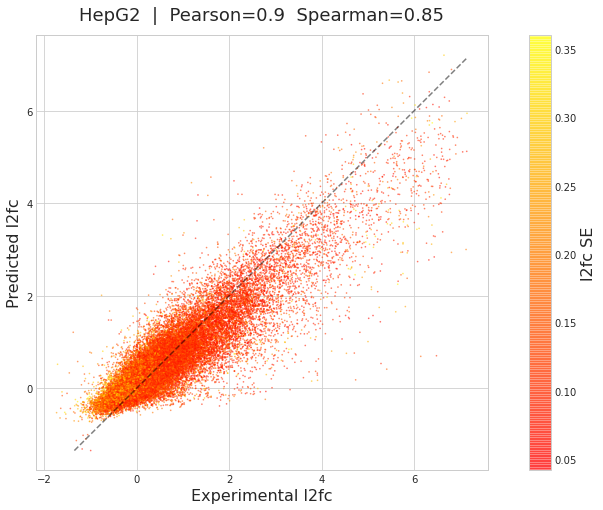

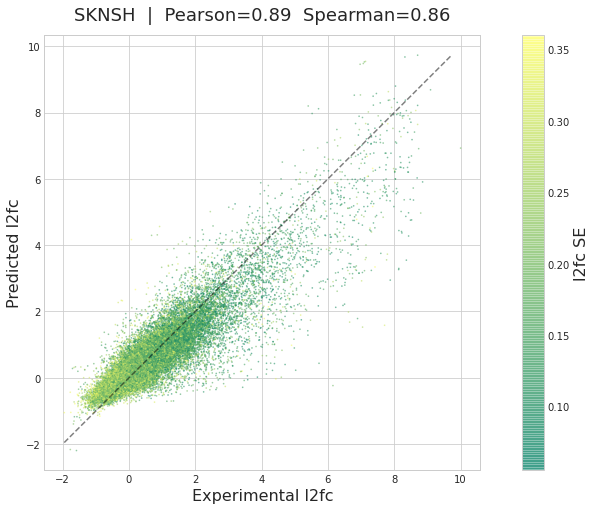

In [251]:
oligo_count_cutoff = 20
rna_count_cutoff = 0

plot_df = test_df[test_df['max_lfcSE'] < 0.36]

activity_columns = ['K562_mean', 'HepG2_mean', 'SKNSH_mean']
coloring_columns = ['lfcSE_k562', 'lfcSE_hepg2', 'lfcSE_sknsh']
colormaps = ['winter', 'autumn', 'summer']
for cell_idx, activity in enumerate(activity_columns):    
    cell_name = activity.rstrip('_mean')
#     plot_df =  test_df[(test_df['ctrl_mean_' + cell_name.lower()] >= oligo_count_cutoff) \
#                        & (test_df['exp_mean_' + cell_name.lower()] > rna_count_cutoff)]
    pred_column_name =  cell_name + '_pred_avg'
    single_scatterplot(data_df=plot_df,
               x_axis=activity,
               y_axis=pred_column_name,
               color_axis=coloring_columns[cell_idx],
               fig_size=(15,8),
               dot_size=0.5,
               title=cell_name,
               dot_alpha=0.5,
               colormap=colormaps[cell_idx],
               x_label='Experimental l2fc',
               y_label='Predicted l2fc',
               color_label='l2fc SE')
    plt.gca().set_aspect('equal', adjustable='box')
    plt.show()
# single_scatterplot(data_df=plot_df,
#            x_axis='entropy',
#            y_axis='entropy_pred_avg',
#            color_axis='max_lfcSE',
#            fig_size=(15,8),
#            dot_size=0.5,
#            title='Entropy',
#            dot_alpha=0.5,
#            colormap='spring',
#            x_label='Experimental entropy',
#            y_label='Predicted entropy',
#            color_label='l2fc SE')
# plt.gca().set_aspect('equal', adjustable='box')
# plt.show()

In [170]:
#data_df = test_df[test_df['max_lfcSE'] < 0.3]

activity_columns = ['K562_mean', 'HepG2_mean', 'SKNSH_mean']

all_pearson_evolutions = []
all_spearman_evolutions = []
for model in model_nicknames:
    print(f'{model}')
    pearson_evolution = []
    spearman_evolution = []
    for SE_cutoff in tqdm(np.linspace(0.075, 3.65, 100)):
        data_df = test_df[test_df['max_lfcSE'] < SE_cutoff]
        pearsons = []
        spearmans = []
        for idx, activity_column in enumerate(activity_columns):
            x_axis = activity_column
            y_axis = prediction_columns_dict[model][idx]
            pearsons.append(round(data_df[[x_axis, y_axis]].corr(method='pearson')[x_axis][1], 4))
            spearmans.append(round(data_df[[x_axis, y_axis]].corr(method='spearman')[x_axis][1], 4))
        pearson_evolution.append(pearsons)
        spearman_evolution.append(spearmans)
    all_pearson_evolutions.append(pearson_evolution)
    all_spearman_evolutions.append(spearman_evolution)
all_pearson_evolutions = np.array(all_pearson_evolutions)
all_spearman_evolutions = np.array(all_spearman_evolutions)

relu


  0%|          | 0/100 [00:00<?, ?it/s]

relu6


  0%|          | 0/100 [00:00<?, ?it/s]

relu_HD


  0%|          | 0/100 [00:00<?, ?it/s]

avg


  0%|          | 0/100 [00:00<?, ?it/s]

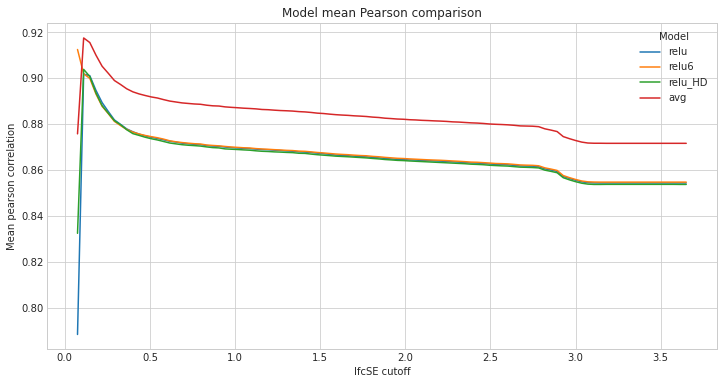

In [252]:
plt_data = all_pearson_evolutions.mean(axis=-1)
with plt.style.context('seaborn-whitegrid'):
    plt.figure(figsize=(12,6))
    plt.plot(np.linspace(0.075, 3.65, 100), plt_data.T)
    #sns.ecdfplot(data=test_df, x='max_lfcSE', color='gray', linestyle='--')
    plt.legend(model_nicknames, title='Model')
    plt.ylabel('Mean pearson correlation')
    plt.xlabel('lfcSE cutoff')
    plt.title('Model mean Pearson comparison')
    plt.show()

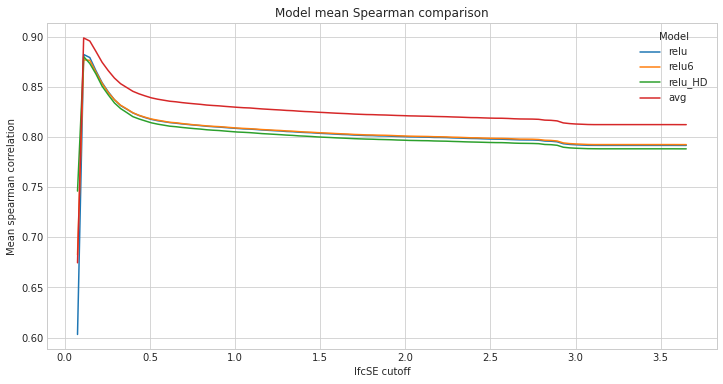

In [199]:
plt_data = all_spearman_evolutions.mean(axis=-1)
with plt.style.context('seaborn-whitegrid'):
    plt.figure(figsize=(12,6))
    plt.plot(np.linspace(0.075, 3.65, 100), plt_data.T)
    plt.legend(model_nicknames, title='Model')
    plt.ylabel('Mean spearman correlation')
    plt.xlabel('lfcSE cutoff')
    plt.title('Model mean Spearman comparison')
    plt.show()

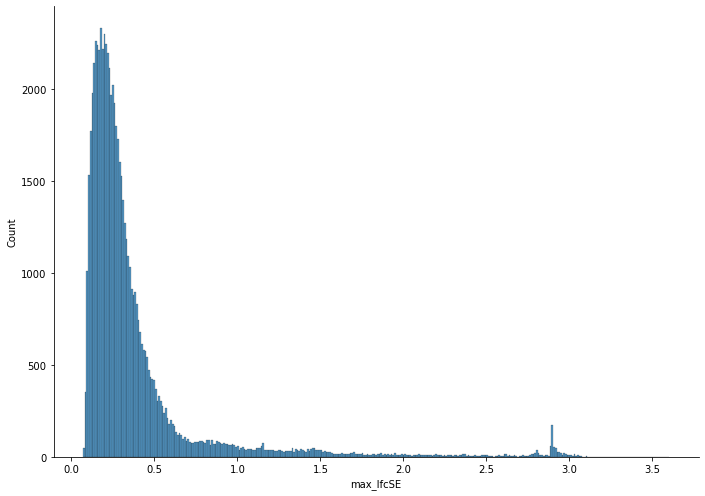

In [208]:
sns.displot(data=test_df, x='max_lfcSE', height=7, aspect=11.7/8.27)
plt.show()

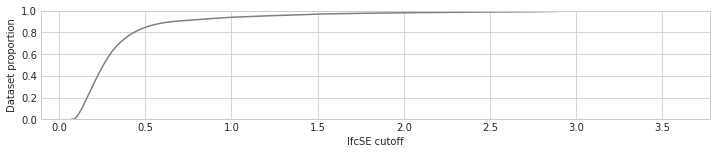

In [219]:
with plt.style.context('seaborn-whitegrid'):
    plt.figure(figsize=(12,2))
    sns.ecdfplot(data=test_df, x='max_lfcSE', color='gray')
    plt.ylabel('Dataset proportion')
    plt.xlabel('lfcSE cutoff')
    plt.show()

In [226]:
plt_data = all_pearson_evolutions.mean(axis=-1)

In [231]:
plt_data[3,:] >= 0.895

array([False,  True,  True,  True,  True,  True,  True,  True,  True,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False])

In [247]:
plt_data[3,10]

0.8932000000000001

In [246]:
np.linspace(0.075, 3.65, 100)[10]

0.43611111111111106

In [241]:
len(test_df[test_df['max_lfcSE'] < 0.36]) / len(test_df)

0.714084422592637